In [1]:
# python modules
import numpy as np
import matplotlib.pyplot as plt
from numpy import save,load
import seaborn as sns
from pathlib import Path
from ipywidgets import interactive,FloatSlider
from matplotlib.colors import LogNorm
import matplotlib.colors as colors
from sklearn.model_selection import ParameterGrid
from scipy import stats

# Own scripts
import model_2D
import data_processing as data_proc
import plotting_funcs_thesis as plt_funcs

# Load Data

In [22]:
path_data = Path('../Data/2D_Model/Grid_Simulation/taua_1000/')
path_data_500 = Path('../Data/2D_Model/Grid_Simulation/taua_500/')
path_matcont = Path('../Data/2D_Model/Matcont_bifurcation/b_04/taua_1000/')
path_regime = Path('../Data/2D_Model/Grid_Simulation/taua_1000/Regime_diagonals_matrices/')

In [3]:
main_path_mult = Path.joinpath(path_data, "Mult_Noise/N_600/Gauss/grid_mult2/")
main_path_addnoadapt = Path.joinpath(path_data, "Add_Noise/Kramers_moyal_N600/noise_exc_only/grid_add_noadaptnoise/")

In [4]:
# loading data mult noise
percUP_matrix = load(Path.joinpath(main_path_mult, "percUP_matrix.npy"))
percDOWN_matrix = load(Path.joinpath(main_path_mult, "percDOWN_matrix.npy"))

meanUP_matrix = load(Path.joinpath(main_path_mult, "meanUP_matrix.npy"))
meanDOWN_matrix = load(Path.joinpath(main_path_mult, "meanDOWN_matrix.npy"))

cvUP_matrix = load(Path.joinpath(main_path_mult, "cvUP_matrix.npy"))
cvDOWN_matrix = load(Path.joinpath(main_path_mult, "cvDOWN_matrix.npy"))

sigma_mult_w_matrix = load(Path.joinpath(main_path_mult, "sigma_mult_w_matrix.npy"))
kramer_matrix = load(Path.joinpath(main_path_mult, "kramer_matrix.npy"))

scc_lag0_matrix = load(Path.joinpath(main_path_mult, "scc_lag0_matrix.npy"))
scc_lag1_matrix = load(Path.joinpath(main_path_mult, "scc_lag1_matrix.npy"))

# loading data add noise
percUP_matrix_add = load(Path.joinpath(main_path_addnoadapt, "percUP_matrix.npy"))
percDOWN_matrix_add = load(Path.joinpath(main_path_addnoadapt, "percDOWN_matrix.npy"))

meanUP_matrix_add = load(Path.joinpath(main_path_addnoadapt, "meanUP_matrix.npy"))
meanDOWN_matrix_add = load(Path.joinpath(main_path_addnoadapt, "meanDOWN_matrix.npy"))

cvUP_matrix_add = load(Path.joinpath(main_path_addnoadapt, "cvUP_matrix.npy"))
cvDOWN_matrix_add = load(Path.joinpath(main_path_addnoadapt, "cvDOWN_matrix.npy"))

scc_lag0_matrix_add = load(Path.joinpath(main_path_addnoadapt, "scc_lag0_matrix.npy"))
scc_lag1_matrix_add = load(Path.joinpath(main_path_addnoadapt, "scc_lag1_matrix.npy"))


# Loading bifurcation data
hopf_x = load(Path.joinpath(path_matcont, "hopf_curve_x.npy"))
hopf_y = load(Path.joinpath(path_matcont, "hopf_curve_y.npy"))
cusp_x = load(Path.joinpath(path_matcont, "cusp_curve_x.npy"))
cusp_y = load(Path.joinpath(path_matcont, "cusp_curve_y.npy"))

In [5]:
nan_perc = np.isnan(percUP_matrix)
sigma_mult_w_matrix_notnan = sigma_mult_w_matrix[~nan_perc]

print(np.mean(sigma_mult_w_matrix))# mean over whole grid
print(np.mean(sigma_mult_w_matrix_notnan)) # mean over those gridpoints where U,D transitions happened

0.21617346519286082
0.21723309950656866


# Plotting Statistics over the grid 

In [6]:
# generating the grid
I_grid = np.arange(-1,4.75,0.25)
w_grid = np.arange(1.5,2.95,0.05)
w_grid = w_grid[::-1] # reversing from big to small values

param_grid = {'I': I_grid,'w': w_grid}
grid = list(ParameterGrid(param_grid))
rows_matrix = len(w_grid)
cols_matrix = len(I_grid)



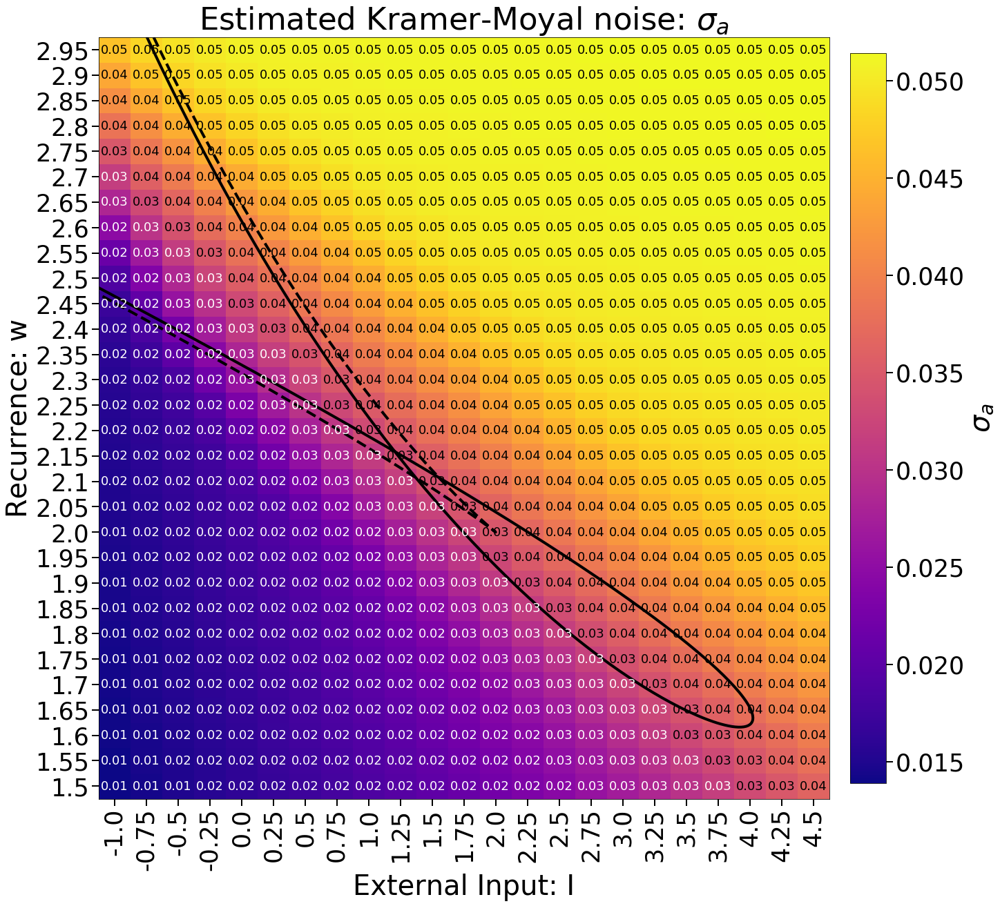

In [7]:
# kramers-moyal noise in the adaptation (b = 0.4 is multiplied with the matrix, b is constant over the grid)
plt_funcs.heatmap_with_bifurcation(0.4*kramer_matrix,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,r"Estimated Kramer-Moyal noise: $\sigma_a$","External Input: I","Recurrence: w",r"$\sigma_a$",round_int = 2,equal_dur = False,saveplot = False)

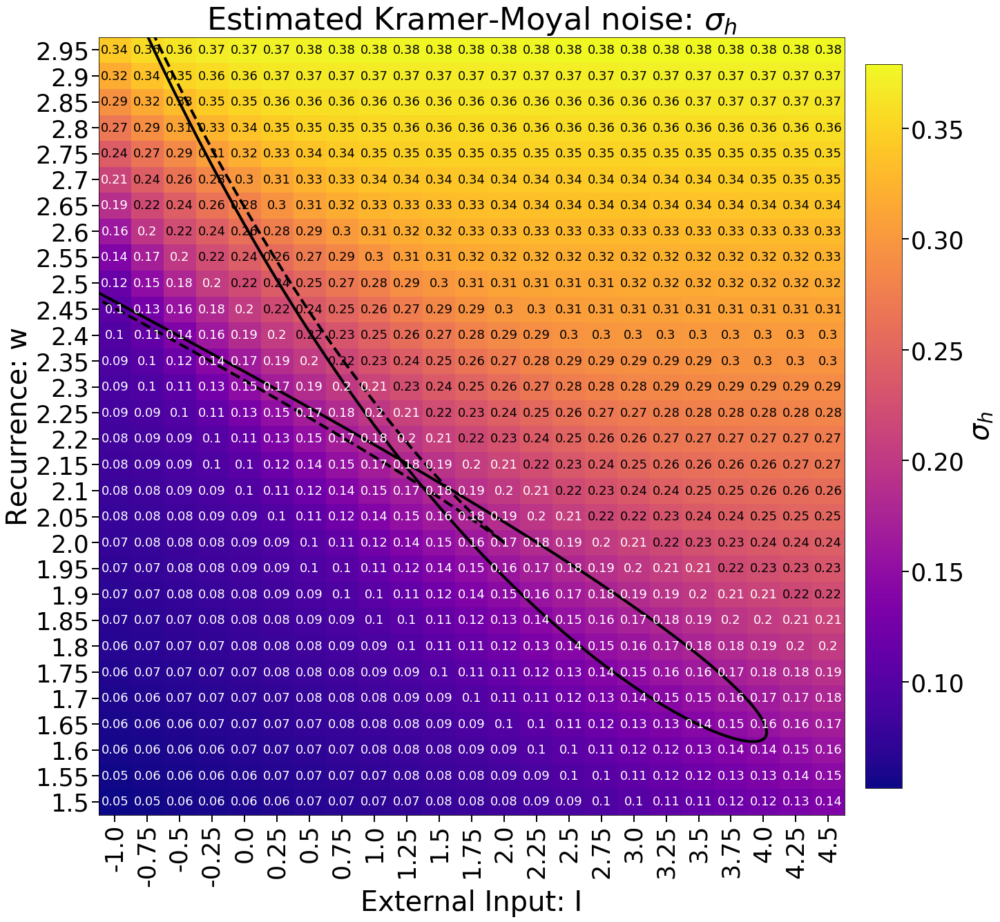

In [10]:
# Kramer Moyal noise in the excitation with w 
plt_funcs.heatmap_with_bifurcation(sigma_mult_w_matrix,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,r"Estimated Kramer-Moyal noise: $\sigma_h$","External Input: I","Recurrence: w",r"$\sigma_h$",round_int = 2,equal_dur = False,saveplot = False)

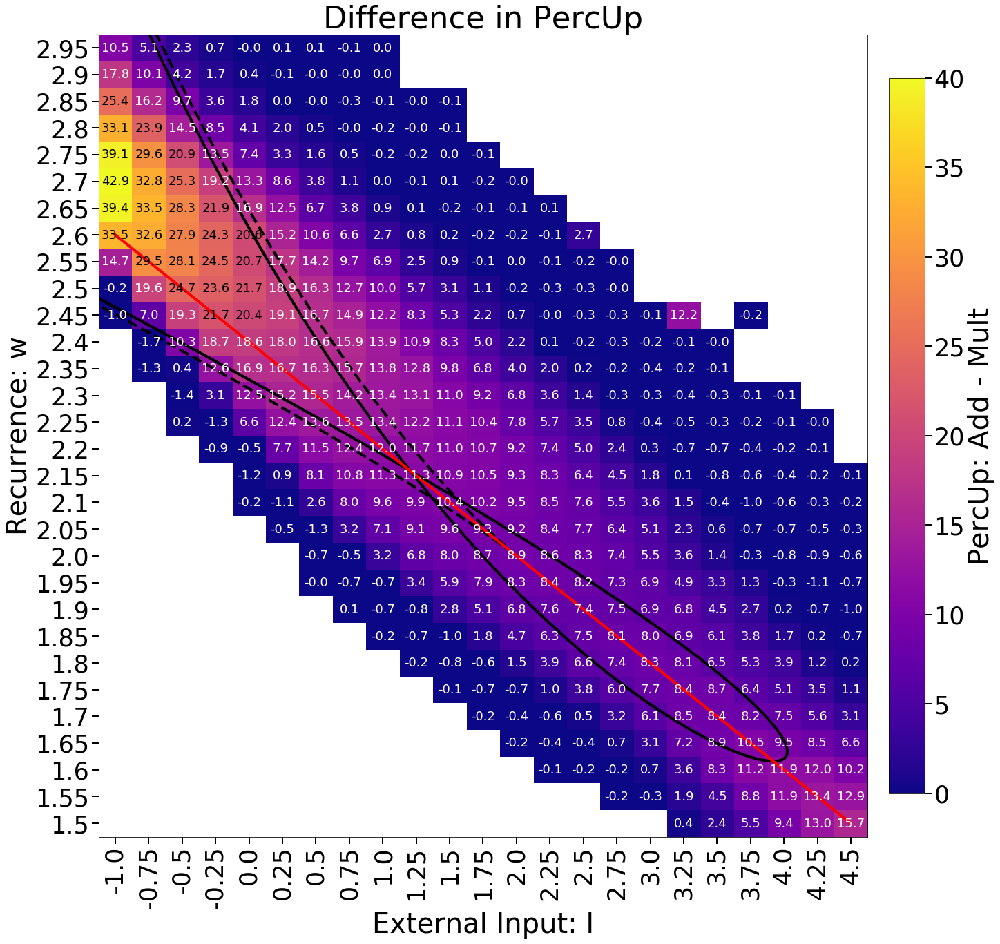

In [9]:
plt_funcs.heatmap_with_bifurcation(percUP_matrix_add-percUP_matrix,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,"Difference in PercUp","External Input: I","Recurrence: w","PercUp: Add - Mult",round_int = 1,vmin = 0,vmax = 40,equal_dur = True,saveplot = False)

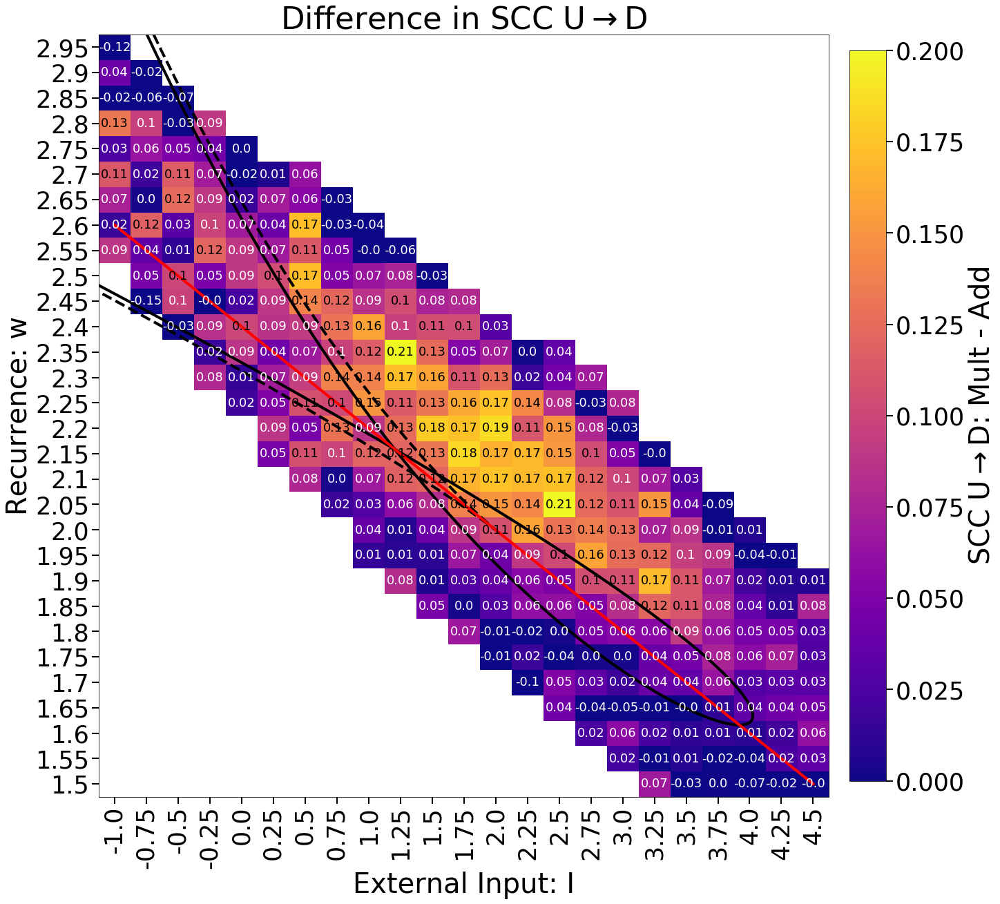

In [12]:
plt_funcs.heatmap_with_bifurcation(scc_lag1_matrix-scc_lag1_matrix_add,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,r"Difference in SCC U$\rightarrow$D","External Input: I","Recurrence: w",r"SCC U$\rightarrow$D: Mult - Add",round_int = 2,vmin = 0,vmax = 0.2,equal_dur = True,saveplot = False)

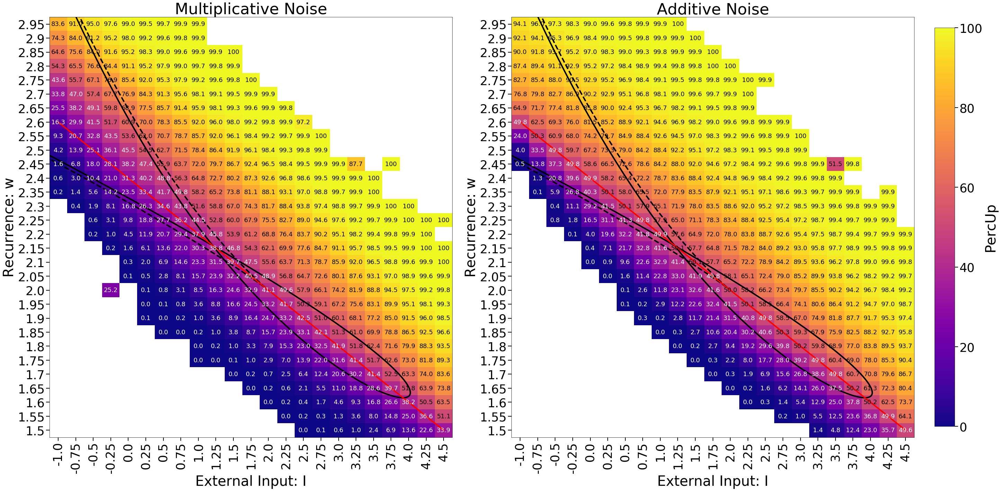

In [8]:
plt_funcs.heatmap_with_bifurcation_compare(percUP_matrix,percUP_matrix_add,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,"Multiplicative Noise","Additive Noise","External Input: I","Recurrence: w","PercUp",round_int = 1,vmin = 0,vmax = 100,equal_dur = True,saveplot = False)

/opt/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


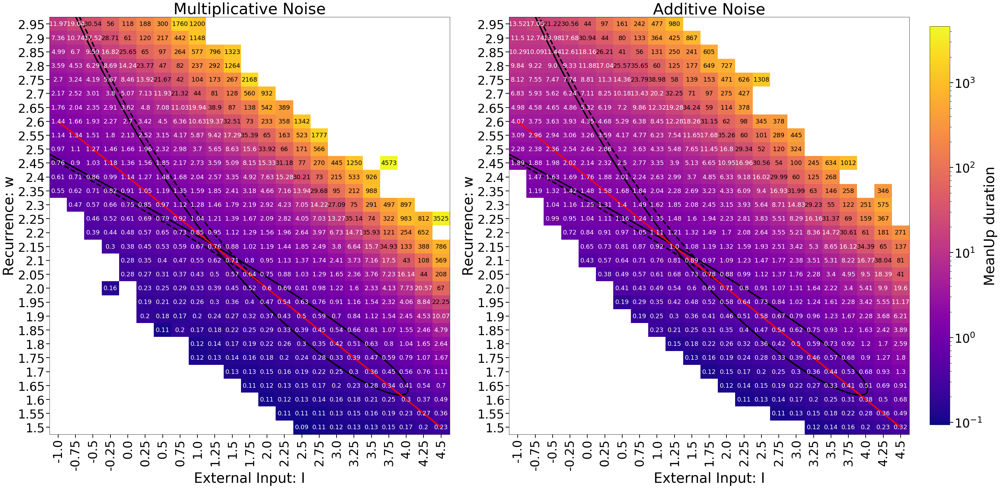

In [14]:
plt_funcs.heatmap_with_bifurcation_compare(meanUP_matrix,meanUP_matrix_add,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,"Multiplicative Noise","Additive Noise","External Input: I","Recurrence: w","MeanUp duration",round_int = 2,max_float = 40,round_int2 = 0,equal_dur = True,saveplot = False,norm = LogNorm())

/opt/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


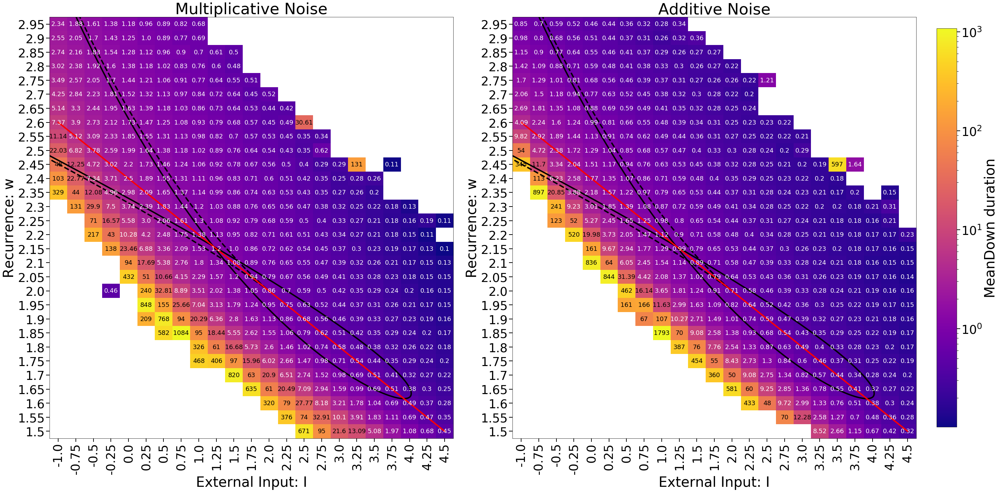

In [15]:
plt_funcs.heatmap_with_bifurcation_compare(meanDOWN_matrix,meanDOWN_matrix_add,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,"Multiplicative Noise","Additive Noise","External Input: I","Recurrence: w","MeanDown duration",round_int = 2,max_float = 40,round_int2 = 0,equal_dur = True,saveplot = False,norm = LogNorm())

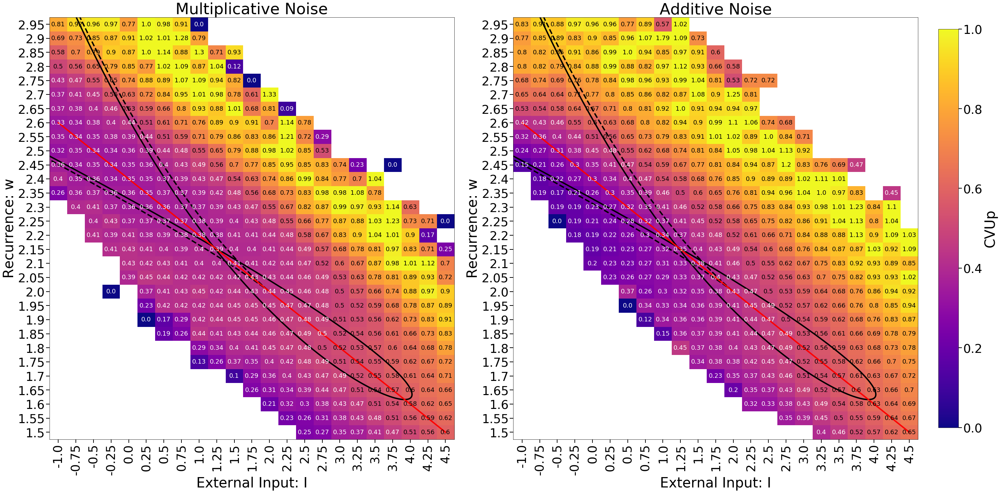

In [16]:
plt_funcs.heatmap_with_bifurcation_compare(cvUP_matrix,cvUP_matrix_add,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,"Multiplicative Noise","Additive Noise","External Input: I","Recurrence: w","CVUp",vmin = 0,vmax = 1,round_int = 2,max_float = 40,round_int2 = 0,equal_dur = True,saveplot = False)

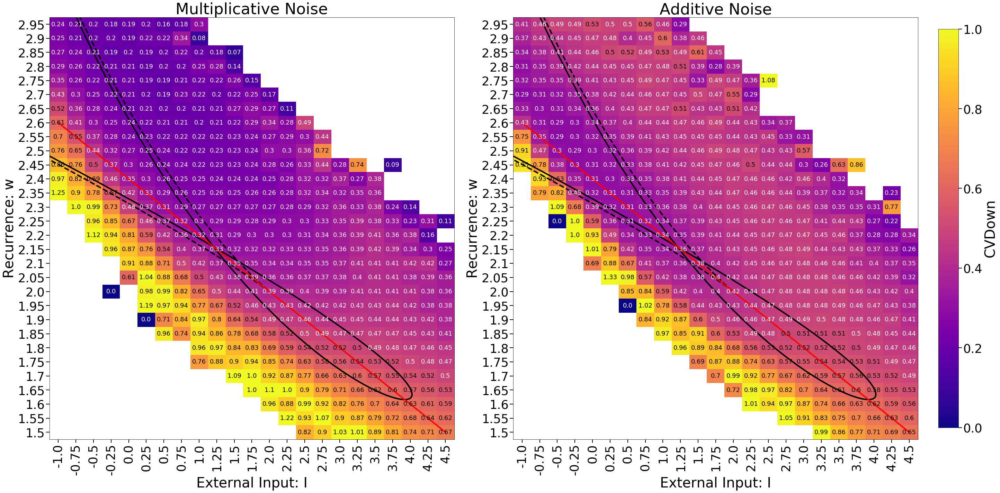

In [17]:
plt_funcs.heatmap_with_bifurcation_compare(cvDOWN_matrix,cvDOWN_matrix_add,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,"Multiplicative Noise","Additive Noise","External Input: I","Recurrence: w","CVDown",vmin = 0,vmax = 1,round_int = 2,max_float = 40,round_int2 = 0,equal_dur = True,saveplot = False)

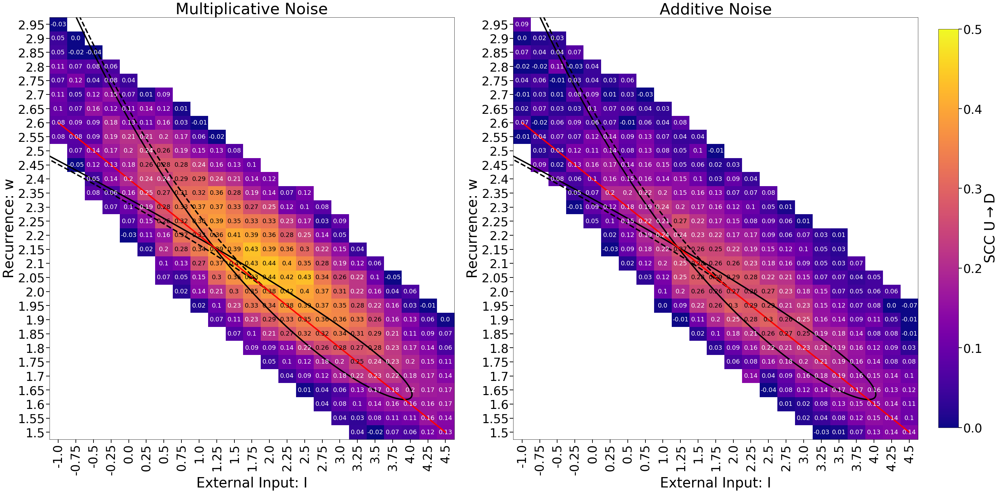

In [18]:
plt_funcs.heatmap_with_bifurcation_compare(scc_lag1_matrix,scc_lag1_matrix_add,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,"Multiplicative Noise","Additive Noise","External Input: I","Recurrence: w",r"SCC U$\rightarrow$D",round_int = 2,vmin = 0,vmax = 0.5,equal_dur = True,saveplot = False)

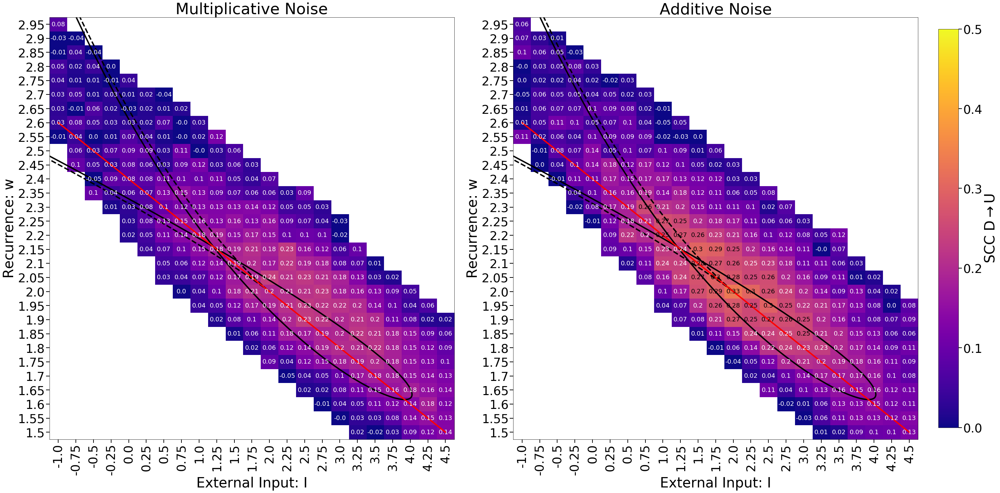

In [19]:
plt_funcs.heatmap_with_bifurcation_compare(scc_lag0_matrix,scc_lag0_matrix_add,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,"Multiplicative Noise","Additive Noise","External Input: I","Recurrence: w",r"SCC D$\rightarrow$U",round_int = 2,vmin = 0,vmax = 0.5,equal_dur = True,saveplot = False)

# Showing Kramers-Moyal estimation

In [20]:
plt.style.use('default')
params = {'figure.figsize': (10,8),
          'lines.linewidth': 4,
          'legend.fontsize': 25,
         'axes.labelsize': 35,
         'axes.titlesize':35,
         'xtick.labelsize':35,
         'ytick.labelsize':35,
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)

In [10]:
w = 2.65 # using this specific griddpoint
beta = 0.4

I = -1# using this specific griddpoint
theta = 10

g = 0.25


params_sigmoid = [g,theta]
params_weights = [beta,w,I]

In [22]:
# check 2D model parameters, want to have model_2D.tau_a = 1,model_2D.N = 600
model_2D.tau_a,model_2D.N

(1, 600)

In [12]:
# run mult gauss noise simulation over 6000s with storing all increment statistics
sim_time,h,a,rate,kramer_sig_hist= model_2D.run_sim_2D(6000,model_2D.sigmoidal_transfer,model_2D.f_mult_gauss_noise,params_sigmoid,params_weights)

In [11]:
# compare to the grid simulation where sigma is stored but not all increments are stored
sim_time,h,a,rate,kramer_sig = model_2D.run_sim_2D_grid(6000,model_2D.sigmoidal_transfer,model_2D.f_mult_gauss_noise,params_sigmoid,params_weights)

In [470]:
w*kramer_sig

0.18833822832981212

In [471]:
kramer = w*np.std(kramer_sig_hist)

In [22]:
kramer

0.1881920906335144

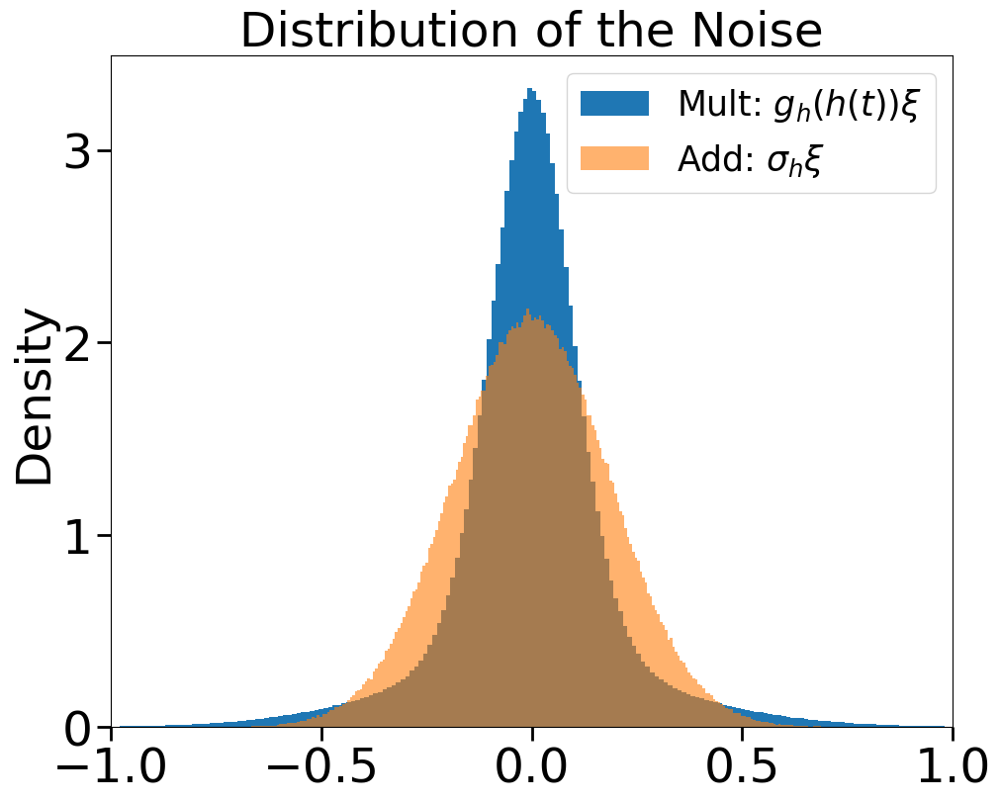

In [13]:
plt.hist(w*kramer_sig_hist,bins = 300,density = True,label = r"Mult: $g_h(h(t))\xi$")
plt.hist(w*np.std(kramer_sig_hist)*np.random.randn(1000000),bins = 300,density = True,alpha = 0.6,label = r"Add: $\sigma_h\xi$")
plt.ylabel("Density")
plt.title("Distribution of the Noise")
plt.xlim(-1,1)
plt.legend()
#plt.savefig(save_path,dpi=200)
plt.show()

In [13]:
from matplotlib.ticker import FormatStrFormatter
from matplotlib import cycler
colors = cycler('color',
                ['#E24A33','black','#348ABD','#988ED5','#777777','#FBC15E','#8EBA42','#FFB5B8'])
def plot_exc_only_2D(sim_time,rate,start_time = None,end_time = None,save_path = None,saveplot = False):
    """Plotting 2D dynamics firing rate and adaptation"""
    plt.style.use('default')
    params = {'figure.figsize': (28,7),
            'axes.prop_cycle': colors,
              'lines.linewidth': 5,
              'legend.fontsize': 40,
             'axes.labelsize': 50,
             'axes.titlesize':60,
             'xtick.labelsize':45,
             'ytick.labelsize':45,
              'xtick.major.size': 16,
               'xtick.major.width' : 2,
               'xtick.minor.size' :10,
               'xtick.minor.width' : 2,
              'ytick.major.size': 16,
               'ytick.major.width' : 2,
               'ytick.minor.size' :10,
               'ytick.minor.width' : 2,
             'figure.constrained_layout.use': False}
    plt.rcParams.update(params)

    if start_time != None and end_time != None:
        time_step = sim_time[1]-sim_time[0]
        start_time = int(start_time/time_step)
        end_time = int(end_time/time_step)

    sim_time_cut = sim_time[start_time:end_time]
    rate_cut = rate[start_time:end_time]

    fig, ax1 = plt.subplots(1)
    ax1.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))# restrict decimal to 2

    ax1.plot(sim_time_cut,rate_cut)
    ax1.set_xlabel("s")
    ax1.set_ylabel("Hz")
    ax1.set_yticks(np.arange(0,max(rate_cut)+2.5,step=2.5))
    plt.tight_layout()

    # possibility to save the plot
    if saveplot:
        plt.savefig(save_path,dpi=200)

    plt.show()

infl points [7.638675374166148, 2.17939120449183]
THRESH DOWN 2.18
THRESH UP 7.64
pvalue 0.001
variance of firing rate 12.514
Up and Down Transitions present!


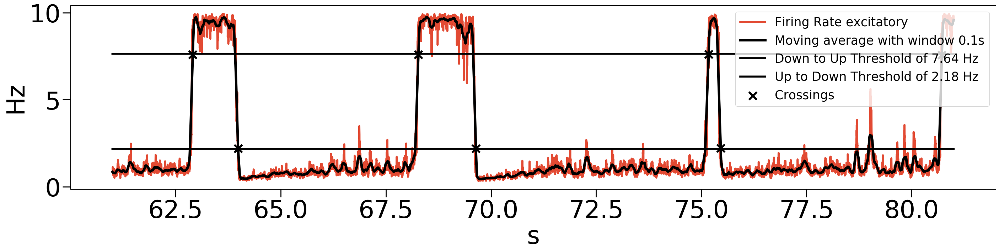

In [472]:
# run mult gauss simulation over 2000s and get the crossings as well to plot the kramers-moyal seperate for Up and Downs states
results,simulation_results,sim_cut_results,crossings,UP_dur,DOWN_dur = model_2D.get_stats_durations(2000,params_sigmoid,params_weights,model_2D.run_sim_2D,model_2D.f_mult_gauss_noise)

In [474]:
# process the increment statistics
kramer_results = simulation_results[-1]
cut_off_start = int(1/model_2D.dt)
cut_off_end = int(0.5/model_2D.dt)
kramer_results_cut = kramer_results[cut_off_start:-cut_off_end]

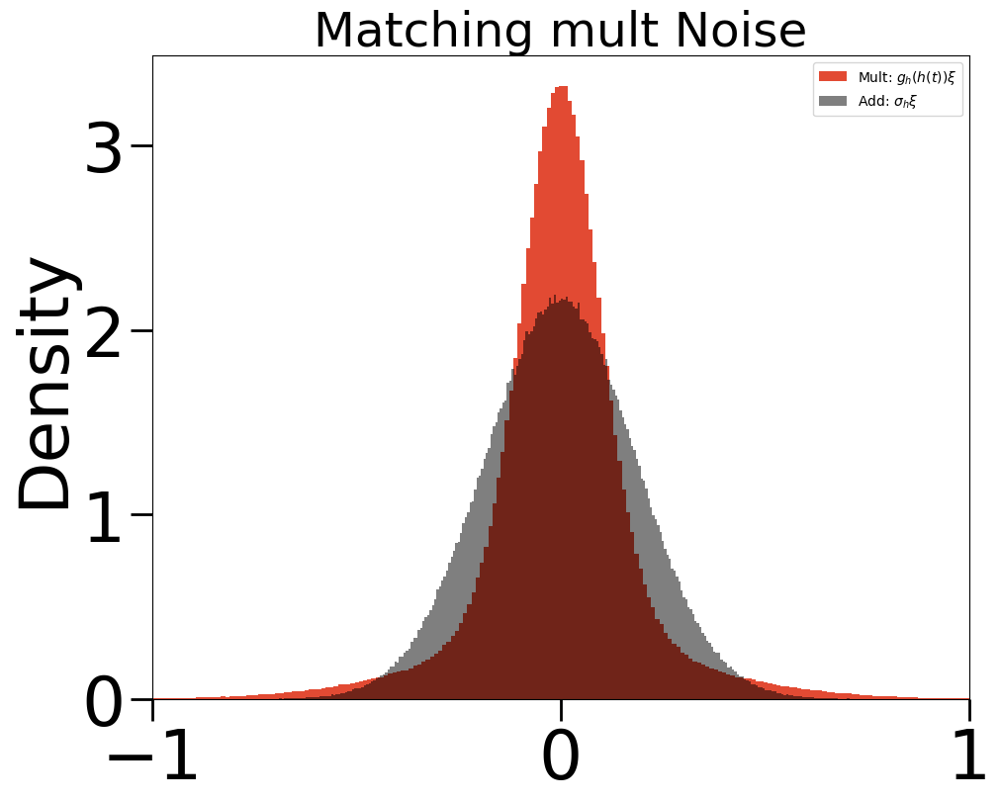

In [475]:
plt.figure(figsize = (10,8))
plt.hist(w*kramer_results_cut,bins = 300,density = True,label = r"Mult: $g_h(h(t))\xi$")
plt.hist(w*np.std(kramer_results_cut)*np.random.randn(1000000),bins = 300,density = True,alpha = 0.5,label = r"Add: $\sigma_h\xi$")
plt.ylabel("Density")
plt.title("Matching mult Noise")
plt.xlim(-1,1)
plt.legend()
#plt.savefig(save_path,dpi=200)
plt.show()

In [28]:
results

(26.01,
 73.99,
 1.7901418685121162,
 0.3677270506910517,
 5.09259861591695,
 0.5609823000786992)

In [476]:
# get increment statistics for Up and Down states
kramer_up = []
kramer_down = []
for (i,crossing_idx) in enumerate(crossings):
    if i > 0:
        prev_cross = crossings[i-1]
        if i %2 == 0:
            kramer_up.extend(kramer_results_cut[prev_cross:crossing_idx])
        else:
            kramer_down.extend(kramer_results_cut[prev_cross:crossing_idx])

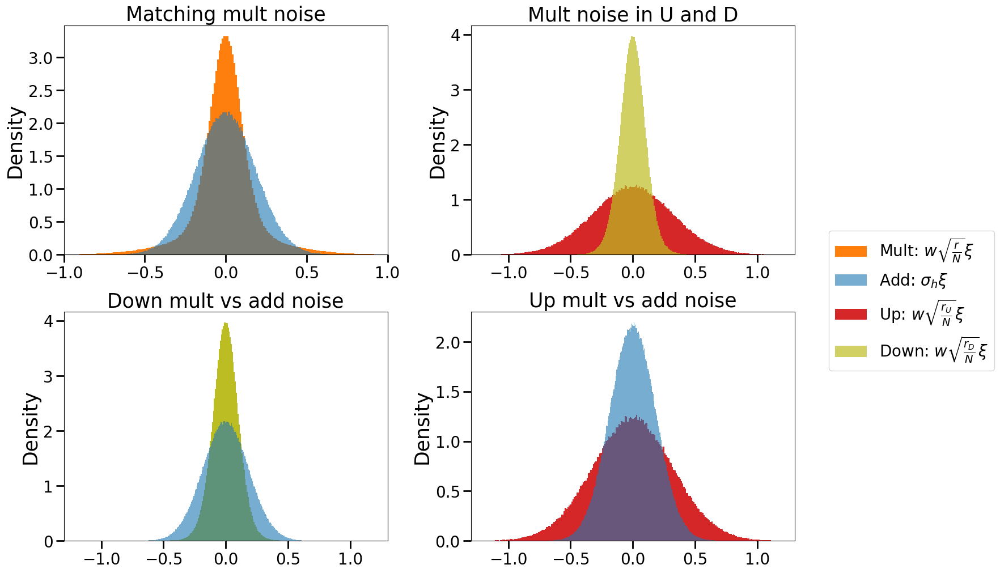

In [513]:
# plotting the increment statistics of Kramers-Moyal
params = {'figure.figsize': (14,10),
          'lines.linewidth': 4,
          'legend.fontsize': 20,
         'axes.labelsize': 25,#25
         'axes.titlesize':25,#25
         'xtick.labelsize':20,#30
         'ytick.labelsize':20,#30
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)

fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize = (14,10),constrained_layout = True)
ax1.hist(w*kramer_results_cut,bins = 300,density = True,label = r"Mult: $w\sqrt{\frac{r}{N}}\xi$",color = "tab:orange")
ax1.hist(w*np.std(kramer_results_cut)*np.random.randn(1000000),bins = 300,density = True,label = r"Add: $\sigma_h\xi$",color = "tab:blue",alpha = 0.6)


ax1.set_ylabel("Density")
ax1.set_title("Matching mult noise")
ax1.set_xlim(-1,1)
#ax1.legend()

ax2.hist(w*np.array(kramer_up),bins = 300,density = True,label = r"Up: $w\sqrt{\frac{r_{U}}{N}}\xi$",color = "tab:red")
ax2.hist(w*np.array(kramer_down),bins = 300,density = True,label = r"Down: $w\sqrt{\frac{r_{D}}{N}}\xi$",color = "tab:olive",alpha = 0.7)

ax2.set_ylabel("Density")
ax2.set_title("Mult noise in U and D")
ax2.set_xlim(-1.3,1.3)
#ax2.legend()

ax3.hist(w*np.array(kramer_down),bins = 300,density = True,color = "tab:olive")
ax3.hist(w*np.std(kramer_results_cut)*np.random.randn(1000000),bins = 300,density = True,alpha = 0.6,color = "tab:blue")
ax3.set_ylabel("Density")
ax3.set_xlim(-1.3,1.3)
ax3.set_title("Down mult vs add noise")
#ax3.legend()


ax4.hist(w*np.array(kramer_up),bins = 300,density = True,color = "tab:red")
ax4.hist(w*np.std(kramer_results_cut)*np.random.randn(1000000),bins = 300,density = True,alpha = 0.6,color = "tab:blue")
ax4.set_ylabel("Density")
ax4.set_title("Up mult vs add noise")
ax4.set_xlim(-1.3,1.3)
#ax4.legend()

leg = fig.legend(loc='right',
                 bbox_to_anchor=(2.9,-0.2), bbox_transform=ax1.transAxes)
#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()

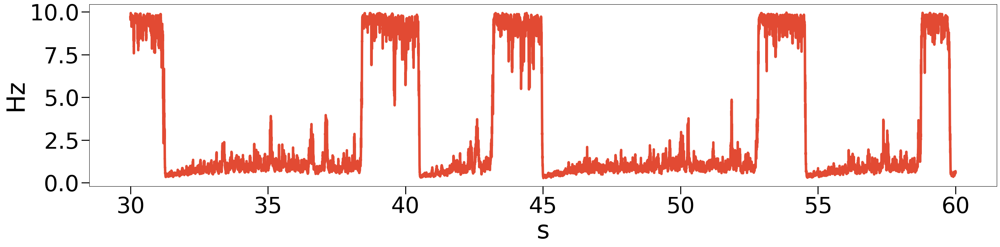

In [18]:
# plotting timeseries and selecting Up states
plt_funcs.plot_exc_only_2D(sim_time,rate,start_time = 30,end_time = 60,saveplot = False)

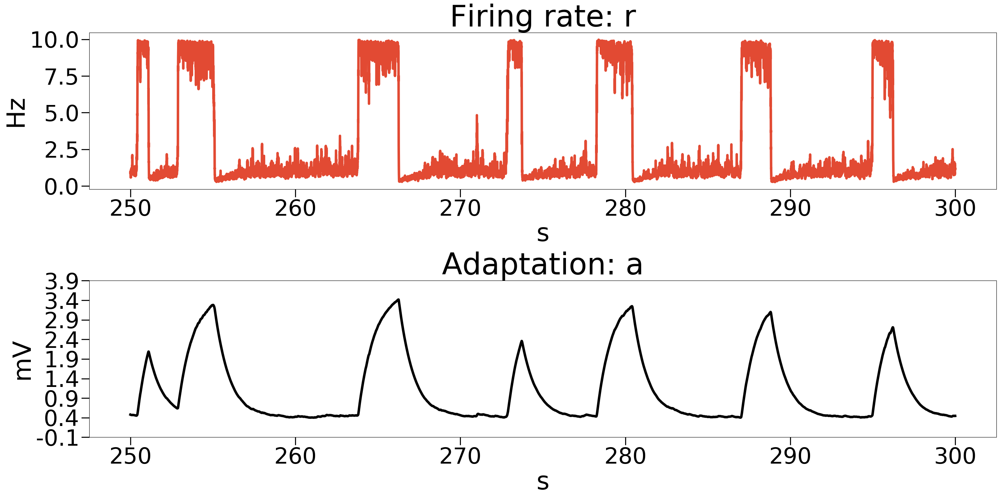

In [43]:
plt_funcs.plot_dynamics_2D(sim_time,rate,a,start_time = 250,end_time = 300,saveplot = False)

In [45]:
kramer

0.1881920906335144

In [23]:
# simulating the corresponding additive noise model
# the f_mult_gauss_noise function is not used in run_sim_2D_grid_noise_constant we really use additive noise model
sim_time_add,h_add,a_add,rate_add,kramer_sig_hist_add = model_2D.run_sim_2D_grid_noise_constant(6000,model_2D.sigmoidal_transfer,model_2D.f_mult_gauss_noise,params_sigmoid,params_weights,kramer)

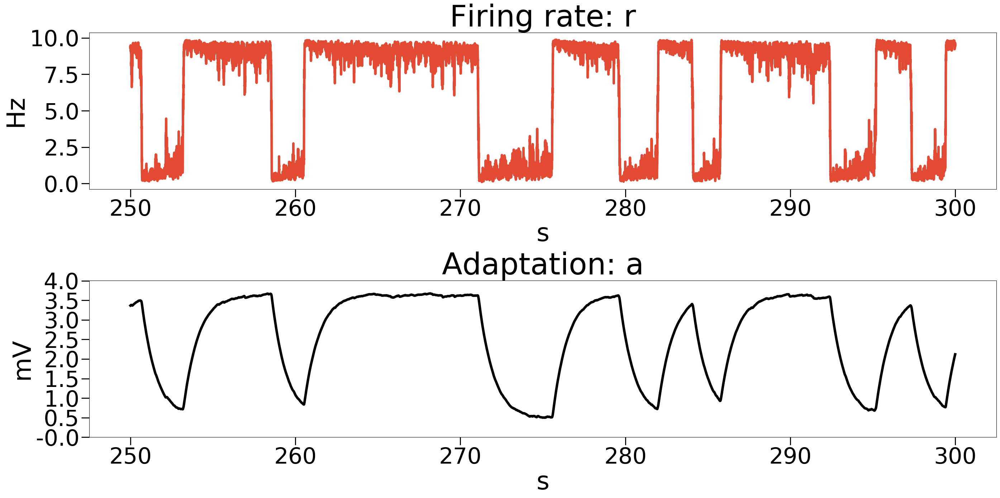

In [44]:
# plotting the timeseries
plt_funcs.plot_dynamics_2D(sim_time_add,rate_add,a_add,start_time = 250,end_time = 300,save_path = path_save,saveplot = True)

coefficients poly [-1.00000000e-02  1.95174928e-01 -9.84238836e-01  1.47127499e-01
  1.32508347e+01]


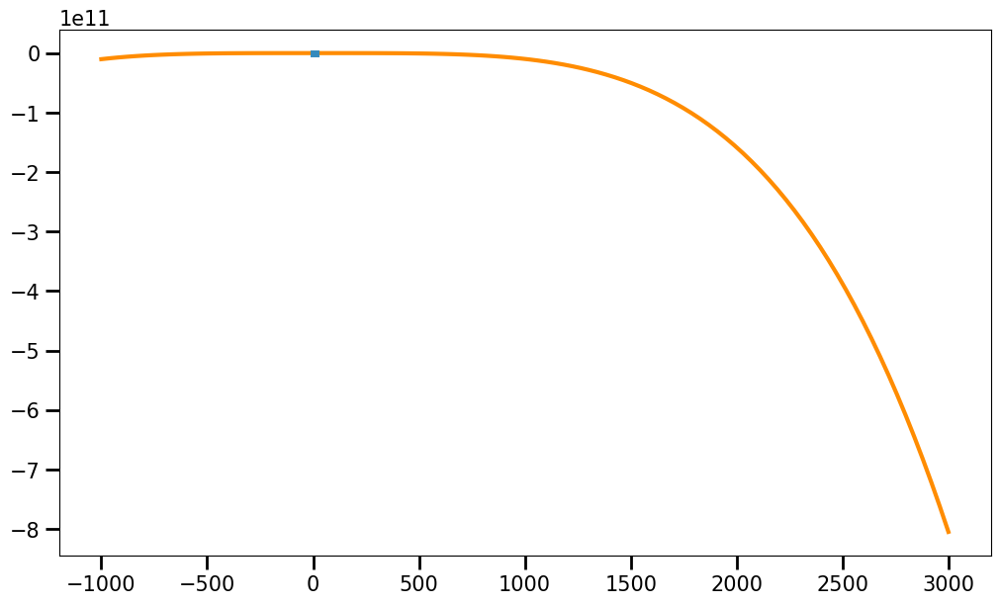

infl points [7.600457962197129, 2.1582884450344038]


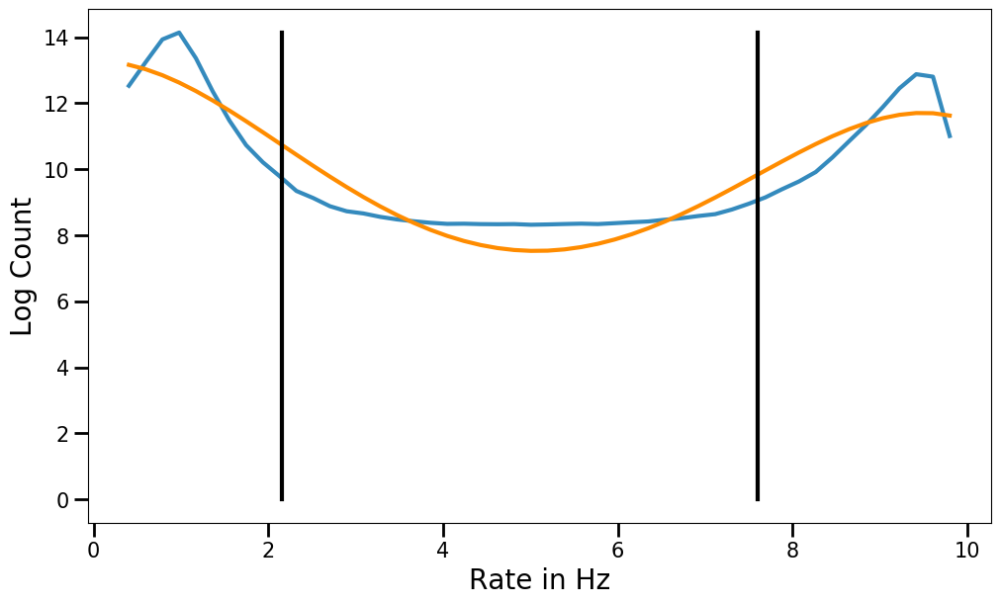

THRESH DOWN 2.16
THRESH UP 7.6
Up and Down Transitions present!
Len UP/DOWN dur equal len 869 869


In [49]:
# compute the statistics
percUP,percDOWN,mean_up,cv_up,mean_down,cv_down,skew_up,skew_down,scc_lag0,scc_lag1 = model_2D.compute_stats_helper(sim_time,rate)

In [38]:
mean_up

1.7361979286536346

coefficients poly [-1.00000000e-02  2.02925039e-01 -1.08667914e+00  6.50373240e-01
  1.22162223e+01]


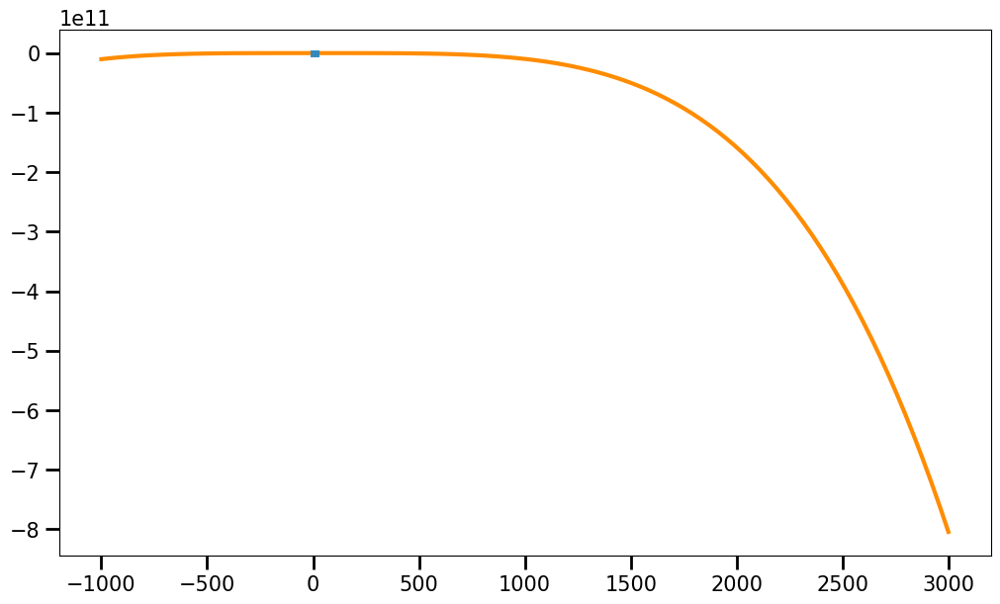

infl points [7.834518416853213, 2.311733543367498]


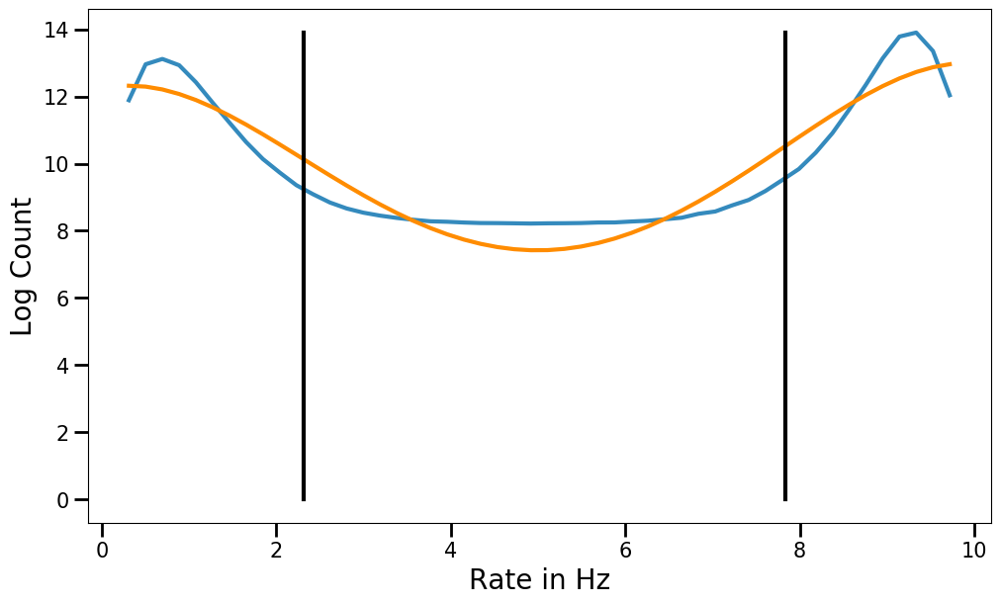

THRESH DOWN 2.31
THRESH UP 7.83
Up and Down Transitions present!
Len UP/DOWN dur no equal len 773 774


In [39]:
percUP,percDOWN,mean_up,cv_up,mean_down,cv_down,skew_up,skew_down,scc_lag0,scc_lag1 = model_2D.compute_stats_helper(sim_time_add,rate_add)

In [50]:
mean_up,percUP

(1.7361979286536346, 25.18)

In [42]:
scc_lag0,scc_lag1

(-0.0010104333103406915, 0.03279212209883728)

# Constant noise over the grid

In [16]:
main_path_add_noadaptNoiseconst = Path.joinpath(path_data, "Add_Noise/Constant_noise/noise_exc_only/sigma_022/grid_add_noadaptnoise_const/")
main_path_add_noadaptNoiseconsthigh = Path.joinpath(path_data, "Add_Noise/Constant_noise/noise_exc_only/sigma_03/grid_add_noadaptnoise_consthigh/")
main_path_add_noadaptNoiseconstlow = Path.joinpath(path_data, "Add_Noise/Constant_noise/noise_exc_only/sigma_013/grid_add_noadaptnoise_constlow/")

main_path_smallN = Path.joinpath(path_data, "Mult_Noise/N_300/Gauss/grid_mult/")
main_path_bigN = Path.joinpath(path_data, "Mult_Noise/N_1200/Gauss/grid_mult/")

#tau_a = 500ms
main_path_mult500 = Path.joinpath(path_data_500, "Mult_Noise/N_600/Gauss/grid_mult/")
main_path_add_noadaptNoiseconst500 = Path.joinpath(path_data_500, "Add_Noise/Constant_noise/sigma_022/grid_add_noadaptnoise_const/")

In [17]:
stats_mult = data_proc.load_stats_data(main_path_mult)
stats_add_change = data_proc.load_stats_data(main_path_addnoadapt)
stats_add_noadaptconst = data_proc.load_stats_data(main_path_add_noadaptNoiseconst)
stats_add_noadaptconsthigh = data_proc.load_stats_data(main_path_add_noadaptNoiseconsthigh)
stats_add_noadaptconstlow = data_proc.load_stats_data(main_path_add_noadaptNoiseconstlow)
stats_data500 = data_proc.load_stats_data(main_path_mult500)
stats_add_noadaptconst500 = data_proc.load_stats_data(main_path_add_noadaptNoiseconst500)
stats_mult300 = data_proc.load_stats_data(main_path_smallN)
stats_mult1200 = data_proc.load_stats_data(main_path_bigN)

In [18]:
matrices_percup = (stats_add_change[0],stats_add_noadaptconst[0],stats_add_noadaptconsthigh[0],stats_add_noadaptconstlow[0])

In [19]:
matrices_scc1 = (stats_add_change[-1],stats_add_noadaptconst[-1],stats_add_noadaptconsthigh[-1],stats_add_noadaptconstlow[-1])

In [20]:
titles = [r"Varying $\sigma_h$",r"Constant $\sigma_h = 0.22$",r"Constant $\sigma_h = 0.3$",r"Constant $\sigma_h = 0.13$"]

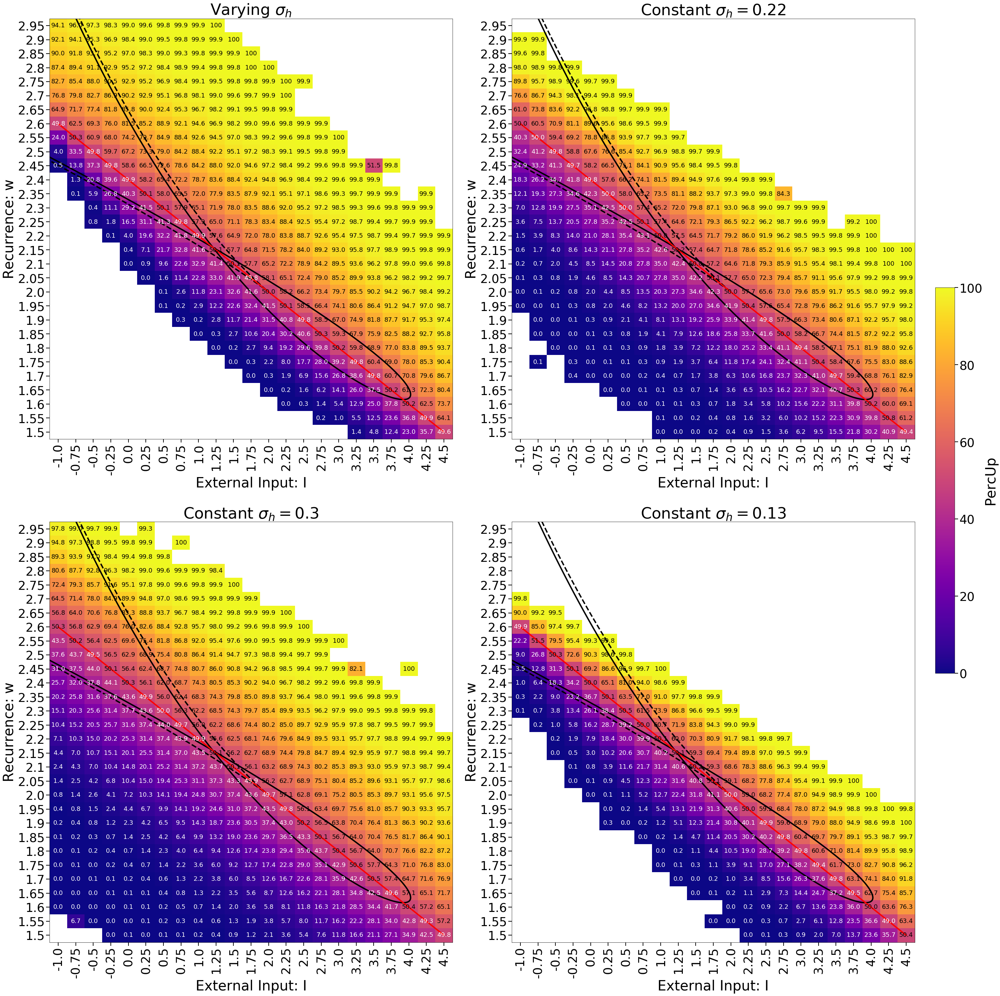

In [21]:
plt_funcs.heatmap_with_bifurcation_compare_four(matrices_percup,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,titles,"External Input: I","Recurrence: w","PercUp",round_int = 1,vmin = 0,vmax = 100,equal_dur = True,saveplot = False)

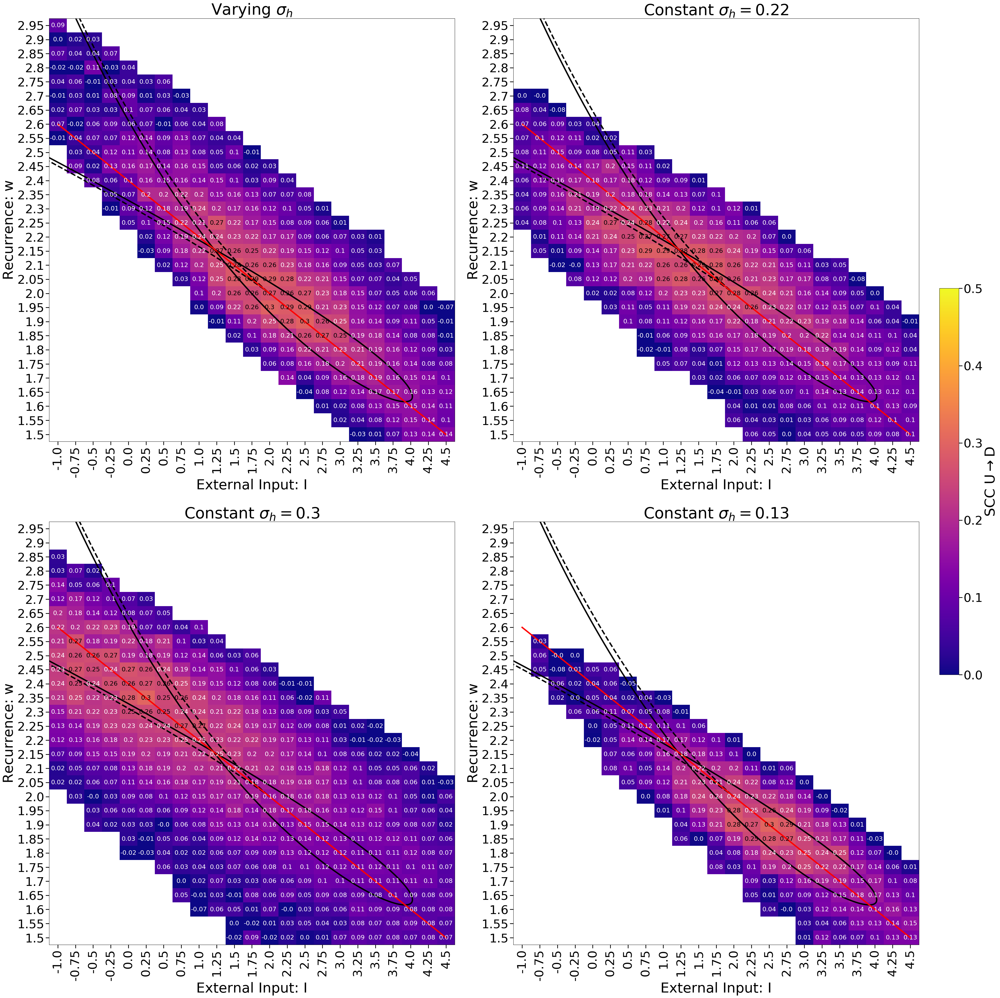

In [39]:
plt_funcs.heatmap_with_bifurcation_compare_four(matrices_scc1,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,titles,"External Input: I","Recurrence: w",r"SCC U$\rightarrow$D",round_int = 2,vmin = 0,vmax = 0.5,equal_dur = True,saveplot = False)

# Using scatterplots for visualisation

In [ ]:
# Loading Data

In [23]:
# Loading regime Data
regime_matrix = load(Path.joinpath(path_regime, "regime_matrix.npy"))

In [24]:
# getting notnan data
data_notnan,regime_notnan,label_notnan = data_proc.getnotnan_scc_data(stats_mult,regime_matrix,0)
data_notnan_tau500,regime_notnan_tau500,label_notnan_tau500 = data_proc.getnotnan_scc_data(stats_data500,regime_matrix,0)
data_notnan_add_tau500,regime_notnan_tau500,label_notnan_tau500 = data_proc.getnotnan_scc_data(stats_add_noadaptconst500,regime_matrix,1)
data_notnan300,regime_notnan300,label_notnan300 = data_proc.getnotnan_scc_data(stats_mult300,regime_matrix,0)
data_notnan1200,regime_notnan1200,label_notnan1200 = data_proc.getnotnan_scc_data(stats_mult1200,regime_matrix,0)
data_notnan_add_noadapt,regime_notnan_add_noadapt,label_notnan_add_noadapt = data_proc.getnotnan_scc_data(stats_add_change,regime_matrix,1)
data_notnan_add_noadaptconst,regime_notnan_add_noadaptconst,label_notnan_add_noadaptconst = data_proc.getnotnan_scc_data(stats_add_noadaptconst,regime_matrix,1)
data_notnan_add_noadaptconsthigh,regime_notnan_add_noadaptconsthigh,label_notnan_add_noadaptconsthigh = data_proc.getnotnan_scc_data(stats_add_noadaptconsthigh,regime_matrix,1)
data_notnan_add_noadaptconstlow,regime_notnan_add_noadaptconstlow,label_notnan_add_noadaptconstlow = data_proc.getnotnan_scc_data(stats_add_noadaptconstlow,regime_matrix,1)

In [19]:
plt.style.use('default')
params = {'figure.figsize': (10,8),
          'figure.titlesize': 35, 
          'lines.linewidth': 4,
          'legend.fontsize': 30,
         'axes.labelsize': 35,
         'axes.titlesize':40,
         'xtick.labelsize':35,
         'ytick.labelsize':35,
          'xtick.major.size': 10,
           'xtick.major.width' : 2,
           'xtick.minor.size' :5,
           'xtick.minor.width' : 2,
          'ytick.major.size': 10,
           'ytick.major.width' : 2,
           'ytick.minor.size' :5,
           'ytick.minor.width' : 2,
         'figure.constrained_layout.use': False}
plt.rcParams.update(params)

In [25]:
filter_mult_scc = np.logical_and(stats_mult[-1]>0.1,stats_mult[-2]>0.1)
data_filtered,regime_filter,label_filter = data_proc.filtered_data(stats_mult,regime_matrix,0,filter_mult_scc)

filter_add_noadapt_scc = np.logical_and(stats_add_change[-1]>0.1,stats_add_change[-2]>0.1)
data_filtered_add_noadapt,regime_filter_add_noadapt,label_filter_add_noadapt = data_proc.filtered_data(stats_add_change,regime_matrix,1,filter_add_noadapt_scc)

filter_add_noadaptconst_scc = np.logical_and(stats_add_noadaptconst[-1]>0.1,stats_add_noadaptconst[-2]>0.1)
data_filtered_add_noadaptconst,regime_filter_add_noadaptconst,label_filter_add_noadaptconst = data_proc.filtered_data(stats_add_noadaptconst,regime_matrix,1,filter_add_noadaptconst_scc)

filter_add_noadaptconsthigh_scc = np.logical_and(stats_add_noadaptconsthigh[-1]>0.1,stats_add_noadaptconsthigh[-2]>0.1)
data_filtered_add_noadaptconsthigh,regime_filter_add_noadaptconsthigh,label_filter_add_noadaptconsthigh = data_proc.filtered_data(stats_add_noadaptconsthigh,regime_matrix,1,filter_add_noadaptconsthigh_scc)

filter_add_noadaptconstlow_scc = np.logical_and(stats_add_noadaptconstlow[-1]>0.1,stats_add_noadaptconstlow[-2]>0.1)
data_filtered_add_noadaptconstlow,regime_filter_add_noadaptconstlow,label_filter_add_noadaptconstlow = data_proc.filtered_data(stats_add_noadaptconstlow,regime_matrix,1,filter_add_noadaptconstlow_scc)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater
  after removing the cwd from sys.path.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in greater
  # Remove the CWD from sys.path while we load stuff.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in greater
  del sys.path[0]


In [26]:
filter_mult_percup = np.logical_or(stats_mult[0]>90,stats_mult[0]<10)
data_filtered_perc,regime_filter_perc,label_filter_perc = data_proc.filtered_data(stats_mult,regime_matrix,0,filter_mult_percup)


filter_add_noadapt_perc = np.logical_or(stats_add_change[0]>90,stats_add_change[0]<10)
data_filtered_add_noadapt_perc,regime_filter_add_noadapt_perc,label_filter_add_noadapt_perc = data_proc.filtered_data(stats_add_change,regime_matrix,1,filter_add_noadapt_perc)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in less
  """


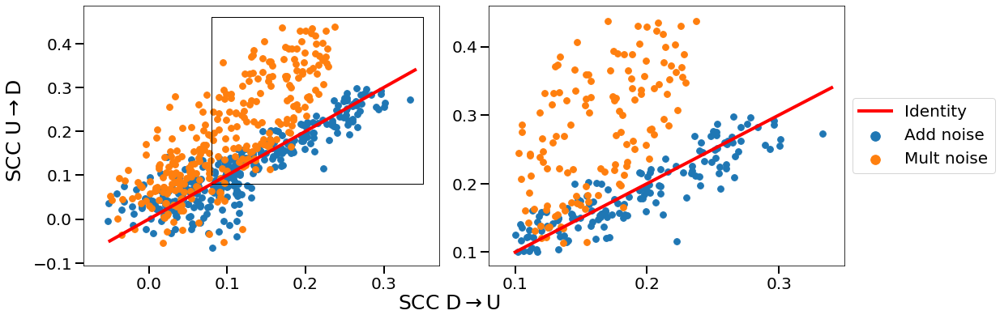

In [27]:
params = {'figure.figsize': (16,6),
          'lines.linewidth': 4,
          'legend.fontsize': 20,
         'axes.labelsize': 25,#25
         'axes.titlesize':25,#25
         'xtick.labelsize':20,#30
         'ytick.labelsize':20,#30
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)

x = np.arange(0.1,0.35,0.01)
x_full = np.arange(-0.05,0.35,0.01)

fig, ax = plt.subplots(1,2,figsize = (14,5),constrained_layout = True)

ax1 = ax[0]
ax2 = ax[1]

ax1.scatter(stats_add_change[-2],stats_add_change[-1],label = "Add noise",s = 60,color = "tab:blue")
ax1.scatter(stats_mult[-2],stats_mult[-1],label = "Mult noise",s = 60,color = "tab:orange")
ax1.plot(x_full,x_full,color = "red",label = "Identity")
ax1.set_xticks(np.arange(-0.1,0.35,0.1))
ax1.plot([0.08,0.2,0.35],[0.08,0.08,0.08],color = "black",linewidth = 1)
ax1.plot([0.08,0.08,0.08],[0.1,0.2,0.46],color = "black",linewidth = 1)
ax1.plot([0.08,0.2,0.35],[0.46,0.46,0.46],color = "black",linewidth = 1)
ax1.plot([0.35,0.35,0.35],[0.08,0.2,0.46],color = "black",linewidth = 1)
ax1.set_xlim()
#ax1.fill_between((0.08,0.35), 0.08, 0.46, facecolor='black', alpha=0.2)


ax2.scatter(data_filtered_add_noadapt[-2],data_filtered_add_noadapt[-1],s = 60,color = "tab:blue")
ax2.scatter(data_filtered[-2],data_filtered[-1],s = 60,color = "tab:orange")
ax2.plot(x,x,color = "red")
ax2.set_yticks(np.arange(0.1,0.4,0.1))
ax2.set_xticks(np.arange(0.1,0.35,0.1))
ax2.set_xlim(0.08,0.35)
ax2.set_ylim(0.08,0.46)
#ax1.legend(markerscale=1.)#,loc = "center right",bbox_to_anchor=(1.6, 0.5))


leg = fig.legend(markerscale = 1.5,loc='center left',
                 bbox_to_anchor=(1, 0.5), bbox_transform=ax[1].transAxes)

fig.text(-0.03,0.4,r"SCC U$\rightarrow$D",rotation = "vertical",fontsize = 25)
fig.text(0.45,-0.05,r"SCC D$\rightarrow$U",fontsize = 25)

#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()


In [51]:
# compute correlation between SCCUD and SCCDU
stats.pearsonr(data_notnan[-2], data_notnan[-1])
#stats.pearsonr(data_notnan_add_noadapt[-2], data_notnan_add_noadapt[-1])

(0.79221591566304, 6.043210435121817e-64)

In [52]:
# filtered data pearson r
stats.pearsonr(data_filtered_add_noadapt[-2],data_filtered_add_noadapt[-1])
#stats.pearsonr(data_filtered[-2],data_filtered[-1])

(0.8914369377204862, 1.056861264390397e-51)

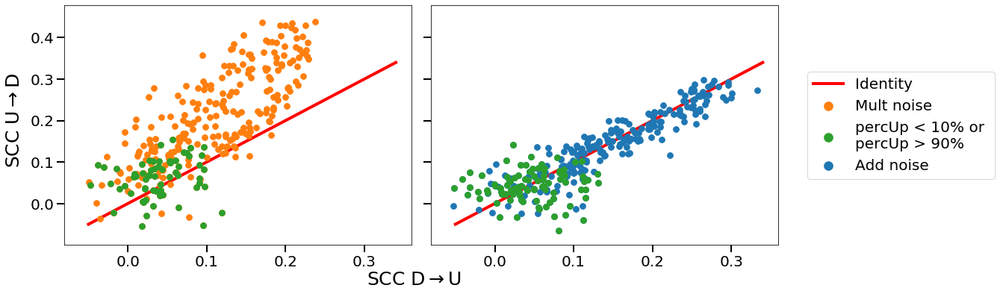

In [28]:
# appendix: show that those with high percentages Up or Down are the ones which have weak correlation
fig, (ax1,ax2) = plt.subplots(1,2,figsize = (14,5),sharex = True,sharey = True,constrained_layout = True)
ax1.scatter(stats_mult[-2],stats_mult[-1],label = "Mult noise",s = 60,color = "tab:orange",zorder = 2)
ax1.scatter(data_filtered_perc[-2],data_filtered_perc[-1],color = "tab:green",s = 60,label = "percUp < 10% or \npercUp > 90%",zorder = 3)#,c = percUP_matrix_add#,cmap = "plasma",vmin = 0,vmax = 100)
ax1.plot(x_full,x_full,color = "red",zorder = 1,label = "Identity")

ax2.scatter(stats_add_change[-2],stats_add_change[-1],label = "Add noise",s = 60,color = "tab:blue",zorder = 2)
ax2.scatter(data_filtered_add_noadapt_perc[-2],data_filtered_add_noadapt_perc[-1],color = "tab:green",s = 60,zorder = 3)
ax2.plot(x_full,x_full,color = "red",zorder = 1)

fig.text(-0.03,0.4,r"SCC U$\rightarrow$D",rotation = "vertical",fontsize = 25)
fig.text(0.45,-0.05,r"SCC D$\rightarrow$U",fontsize = 25)

leg = fig.legend(markerscale = 1.5,loc='right',
                 bbox_to_anchor=(2.7, 0.5), bbox_transform=ax1.transAxes)
#plt.savefig(path_save,dpi=200,bbox_inches='tight')

plt.show()

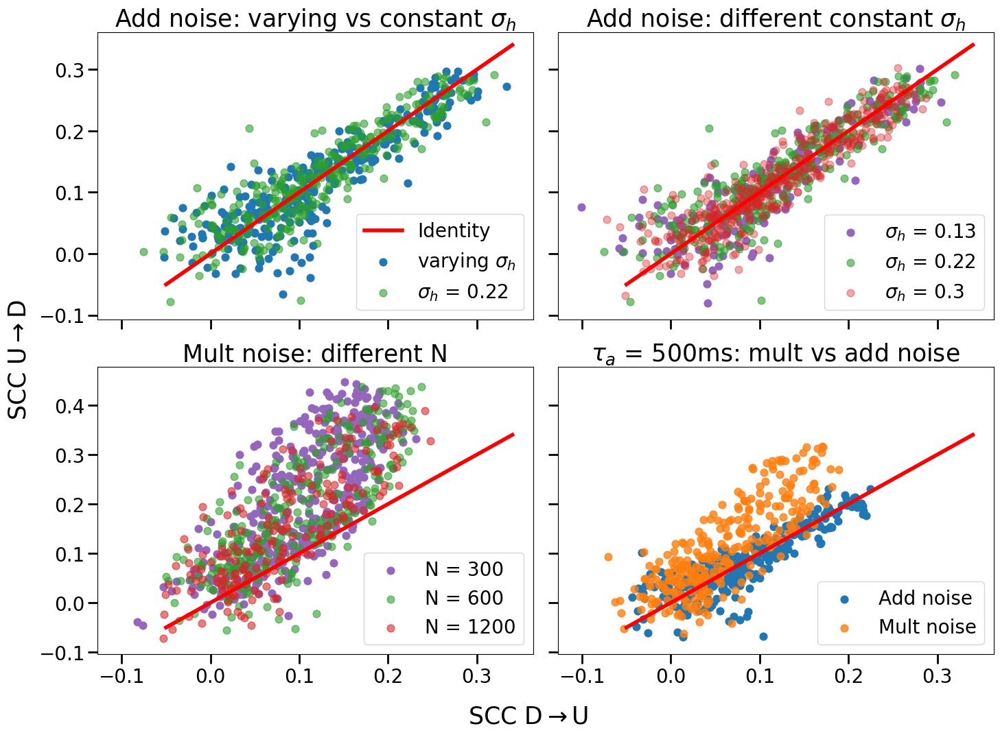

In [54]:
params = {'figure.figsize': (14,10),
          'lines.linewidth': 4,
          'legend.fontsize': 20,
         'axes.labelsize': 25,#25
         'axes.titlesize':25,#25
         'xtick.labelsize':20,#30
         'ytick.labelsize':20,#30
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)

fig,((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize = (14,10),constrained_layout = True,sharex = True,sharey = 'row')
ax1.scatter(stats_add_change[-2],stats_add_change[-1],s = 60,color = "tab:blue", label = r"varying $\sigma_h$")
ax1.scatter(stats_add_noadaptconst[-2],stats_add_noadaptconst[-1],s = 60,color = "tab:green",alpha = 0.6,label = r"$\sigma_h$ = 0.22")
ax1.plot(x_full,x_full,color = "red",label = "Identity")
ax1.set_title(r"Add noise: varying vs constant $\sigma_h$")
ax1.legend(loc = "lower right",fontsize = 20)

ax2.scatter(stats_add_noadaptconstlow[-2],stats_add_noadaptconstlow[-1],label = r"$\sigma_h$ = 0.13",s = 60,color = "tab:purple")
ax2.scatter(stats_add_noadaptconst[-2],stats_add_noadaptconst[-1],label = r"$\sigma_h$ = 0.22",s = 60,color = "tab:green",alpha = 0.6)
ax2.scatter(stats_add_noadaptconsthigh[-2],stats_add_noadaptconsthigh[-1],label = r"$\sigma_h$ = 0.3",s = 60,color = "tab:red",alpha = 0.4)
ax2.plot(x_full,x_full,color = "red")
ax2.legend(loc = "lower right",fontsize = 20)
ax2.set_title(r"Add noise: different constant $\sigma_h$")

ax3.plot(x_full,x_full,color = "red")
ax3.scatter(stats_mult300[-2],stats_mult300[-1],label = "N = 300",s = 60,color = "tab:purple")
ax3.scatter(stats_mult[-2],stats_mult[-1],label = "N = 600",s = 60,alpha = 0.6,color = "tab:green")
ax3.scatter(stats_mult1200[-2],stats_mult1200[-1],label = "N = 1200",s = 60,alpha = 0.6,color = "tab:red")
ax3.legend(loc = "lower right",fontsize = 20)
ax3.set_title(r"Mult noise: different N")


ax4.scatter(stats_add_noadaptconst500[-2],stats_add_noadaptconst500[-1],label = "Add noise",s = 60,color = "tab:blue")
ax4.scatter(stats_data500[-2],stats_data500[-1],s = 60,alpha = 0.8,color = "tab:orange",label = "Mult noise")
ax4.plot(x_full,x_full,color = "red")
ax4.legend(loc = "lower right",fontsize = 20)
ax4.set_title(r"$\tau_a$ = 500ms: mult vs add noise ")


fig.text(-0.03,0.4,r"SCC U$\rightarrow$D",rotation = "vertical",fontsize = 25)
fig.text(0.45,-0.05,r"SCC D$\rightarrow$U",fontsize = 25)

#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()



# Prepare the plots for the section with differing N and Tau_a and sigma

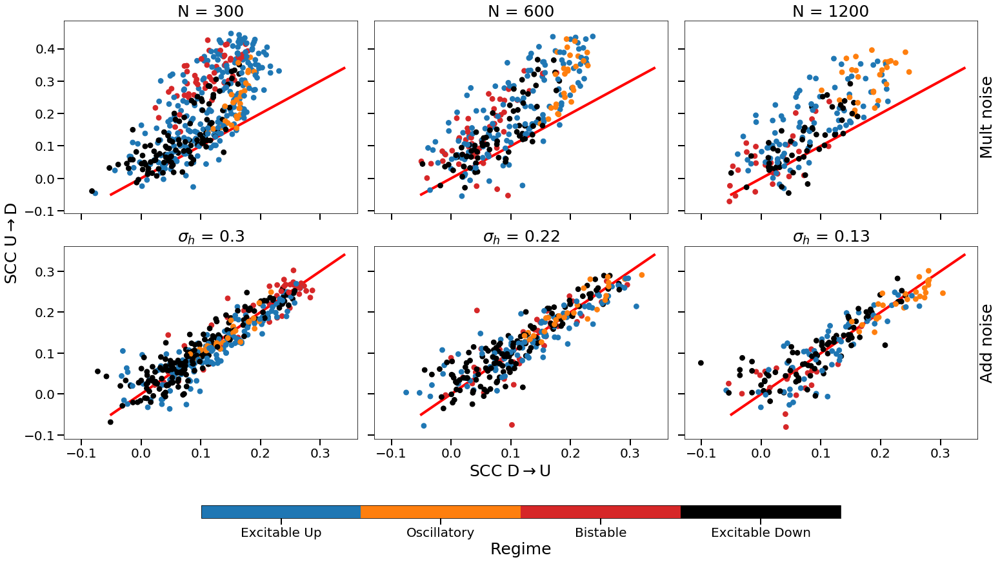

In [29]:
my_colors = ['tab:blue','#ff7f0e','tab:red','black']
my_cmap = colors.ListedColormap(my_colors)
bounds = range(0,5)
norm = colors.BoundaryNorm(bounds, my_cmap.N)

f, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(2,3,figsize=(21,12),constrained_layout=True,sharey = 'row',sharex = True)
#f.suptitle("Mult Noise")
fig1 = ax1.scatter(data_notnan300[-2],data_notnan300[-1],c = regime_notnan300,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
cbar = f.colorbar(fig1,ticks=np.array([0,1,2,3])+0.5, ax = [ax1,ax2,ax3,ax4,ax5,ax6],location = "bottom",shrink = 0.7,pad = 0.075)
cbar.set_label("Regime",fontsize = 25)
cbar.set_ticklabels(["Excitable Up","Oscillatory","Bistable","Excitable Down"])
cbar.ax.tick_params(labelsize=20)

ax1.set_title("N = 300")
ax1.plot(x_full,x_full,color = "red",label = "Identity",zorder = 1)

ax2.scatter(data_notnan[-2],data_notnan[-1],c = regime_notnan,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
#ax2.set_xlabel(r"SCC D$\rightarrow$U")
#ax2.set_ylabel(r"SCC U$\rightarrow$D")
ax2.set_title("N = 600")
ax2.plot(x_full,x_full,color = "red",label = "Identity",zorder = 1)

ax3.scatter(data_notnan1200[-2],data_notnan1200[-1],c = regime_notnan1200,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
ax3.set_title("N = 1200")
ax3.plot(x_full,x_full,color = "red",label = "Identity",zorder = 1)
ax3.set_ylabel("Mult noise")
ax3.yaxis.set_label_position("right")

ax4.scatter(data_notnan_add_noadaptconsthigh[-2],data_notnan_add_noadaptconsthigh[-1],c = regime_notnan_add_noadaptconsthigh,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
ax4.set_title(r"$\sigma_h$ = 0.3")
ax4.plot(x_full,x_full,color = "red",label = "Identity",zorder = 1)


ax5.scatter(data_notnan_add_noadaptconst[-2],data_notnan_add_noadaptconst[-1],c = regime_notnan_add_noadaptconst,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
ax5.set_title(r"$\sigma_h$ = 0.22")
ax5.plot(x_full,x_full,color = "red",label = "Identity",zorder = 1)

ax6.scatter(data_notnan_add_noadaptconstlow[-2],data_notnan_add_noadaptconstlow[-1],c = regime_notnan_add_noadaptconstlow,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
ax6.set_title(r"$\sigma_h$ = 0.13")
ax6.plot(x_full,x_full,color = "red",label = "Identity",zorder = 1)
ax6.set_ylabel("Add noise")
ax6.yaxis.set_label_position("right")

f.text(0.5,0.15,r"SCC D$\rightarrow$U",ha='center',fontsize = 25)
f.text(-0.01,0.5,r"SCC U$\rightarrow$D",ha='center',fontsize = 25,rotation='vertical')

#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()

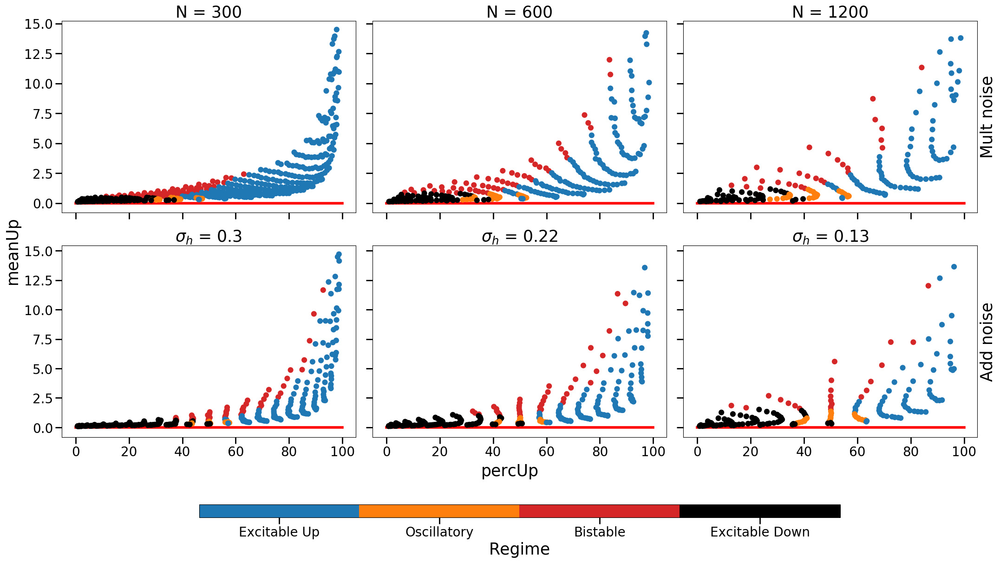

In [57]:
my_colors = ['tab:blue','#ff7f0e','tab:red','black']
my_cmap = colors.ListedColormap(my_colors)
bounds = range(0,5)
norm = colors.BoundaryNorm(bounds, my_cmap.N)

f, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(2,3,figsize=(21,12),constrained_layout=True,sharey = 'row',sharex = True)
#f.suptitle("Mult Noise")
fig1 = ax1.scatter(data_notnan300[0],data_notnan300[2],c = regime_notnan300,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
cbar = f.colorbar(fig1,ticks=np.array([0,1,2,3])+0.5, ax = [ax1,ax2,ax3,ax4,ax5,ax6],location = "bottom",shrink = 0.7,pad = 0.075)
cbar.set_label("Regime",fontsize = 25)
cbar.set_ticklabels(["Excitable Up","Oscillatory","Bistable","Excitable Down"])
cbar.ax.tick_params(labelsize=20)
x_perc = [0,100]
x_scc = [0,0]
ax1.set_title("N = 300")
ax1.plot(x_perc,x_scc,color = "red",label = "Identity",zorder = 1)

ax2.scatter(data_notnan[0],data_notnan[2],c = regime_notnan,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
#ax2.set_xlabel(r"SCC D$\rightarrow$U")
#ax2.set_ylabel(r"SCC U$\rightarrow$D")
ax2.set_title("N = 600")
ax2.plot(x_perc,x_scc,color = "red",label = "Identity",zorder = 1)

ax3.scatter(data_notnan1200[0],data_notnan1200[2],c = regime_notnan1200,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
ax3.set_title("N = 1200")
ax3.plot(x_perc,x_scc,color = "red",label = "Identity",zorder = 1)
ax3.set_ylabel("Mult noise")
ax3.yaxis.set_label_position("right")

ax4.scatter(data_notnan_add_noadaptconsthigh[0],data_notnan_add_noadaptconsthigh[2],c = regime_notnan_add_noadaptconsthigh,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
ax4.set_title(r"$\sigma_h$ = 0.3")
ax4.plot(x_perc,x_scc,color = "red",label = "Identity",zorder = 1)


ax5.scatter(data_notnan_add_noadaptconst[0],data_notnan_add_noadaptconst[2],c = regime_notnan_add_noadaptconst,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
ax5.set_title(r"$\sigma_h$ = 0.22")
ax5.plot(x_perc,x_scc,color = "red",label = "Identity",zorder = 1)

ax6.scatter(data_notnan_add_noadaptconstlow[0],data_notnan_add_noadaptconstlow[2],c = regime_notnan_add_noadaptconstlow,cmap = my_cmap,norm = norm,s = 60,zorder = 2)
ax6.set_title(r"$\sigma_h$ = 0.13")
ax6.set_ylabel("Add noise")
ax6.yaxis.set_label_position("right")
ax6.plot(x_perc,x_scc,color = "red",label = "Identity",zorder = 1)

f.text(0.5,0.15,r"percUp",ha='center',fontsize = 25)
f.text(-0.01,0.5,r"meanUp",ha='center',fontsize = 25,rotation='vertical')

#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()

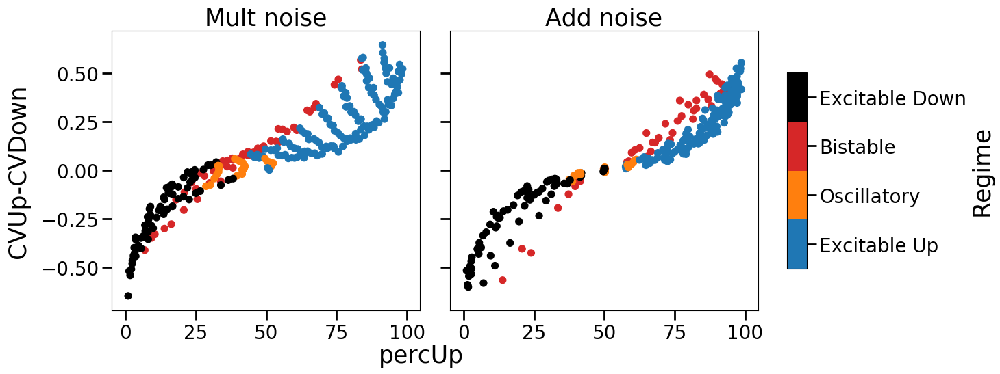

In [58]:
# CV diff plot
params = {'figure.figsize': (14,10),
          'lines.linewidth': 4,
          'legend.fontsize': 20,
         'axes.labelsize': 25,#25
         'axes.titlesize':25,#25
         'xtick.labelsize':20,#30
         'ytick.labelsize':20,#30
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)
my_colors = ['tab:blue','#ff7f0e','tab:red','black']
my_cmap = colors.ListedColormap(my_colors)
bounds = range(0,5)
norm = colors.BoundaryNorm(bounds, my_cmap.N)

f, (ax1, ax2) = plt.subplots(1,2,figsize=(14,5),constrained_layout=True,sharey = 'row',sharex = True)

fig1 = ax1.scatter(data_notnan[0],data_notnan[-4]-data_notnan[-3],s = 50,c = regime_notnan,cmap = my_cmap,norm = norm)
cbar = f.colorbar(fig1,ticks=np.array([0,1,2,3])+0.5, ax = [ax1,ax2],location = "right",pad = 0.025,shrink = 0.7)
cbar.set_label("Regime",fontsize = 25)
cbar.set_ticklabels(["Excitable Up","Oscillatory","Bistable","Excitable Down"])
cbar.ax.tick_params(labelsize=20)
ax1.set_title("Mult noise")

ax2.scatter(data_notnan_add_noadapt[0],data_notnan_add_noadapt[-4]-data_notnan_add_noadapt[-3],s = 50,c = regime_notnan_add_noadapt,cmap = my_cmap,norm = norm,zorder = 3)
ax2.set_title("Add noise")

f.text(0.4,-0.05,r"percUp",ha='center',fontsize = 25)
f.text(-0.02,0.27,r"CVUp-CVDown",ha='center',fontsize = 25,rotation='vertical')


#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()

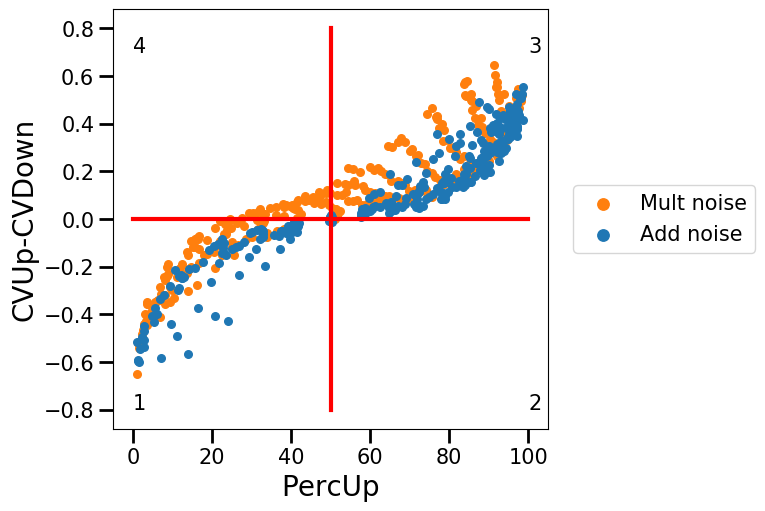

In [59]:
plt.figure(figsize = (7,5))
params = {'figure.figsize': (7,5),
          'lines.linewidth': 4,
          'legend.fontsize': 15,
         'axes.labelsize': 20,#25
         'axes.titlesize':25,#25
         'xtick.labelsize':15,#30
         'ytick.labelsize':15,#30
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)
plt.scatter(data_notnan[0],data_notnan[-4]-data_notnan[-3],label = "Mult noise",s = 30,color = "tab:orange")
plt.scatter(data_notnan_add_noadapt[0],data_notnan_add_noadapt[-4]-data_notnan_add_noadapt[-3],label = "Add noise",s = 30,color = "tab:blue")

plt.plot([0,100],[0,0],color = "red",linewidth = 3)
plt.plot([50,50],[-0.8,0.8],color = "red",linewidth = 3)
plt.xlabel("PercUp")
plt.ylabel("CVUp-CVDown")

plt.text(0,-0.8,"1",fontsize = 15)
plt.text(100,-0.8,"2",fontsize = 15)
plt.text(100,0.7,"3",fontsize = 15)

plt.text(0,0.7,"4",fontsize = 15)
plt.legend(markerscale = 1.5,loc='right',
                 bbox_to_anchor=(1.5, 0.5))
#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()



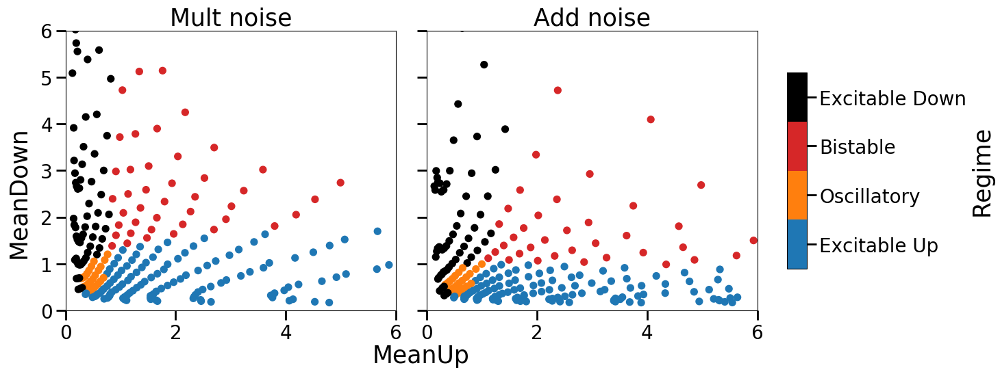

In [60]:
# other scatterplots of statistics for appendix
# meanUp meanDown
params = {'figure.figsize': (14,10),
          'lines.linewidth': 4,
          'legend.fontsize': 20,
         'axes.labelsize': 25,#25
         'axes.titlesize':25,#25
         'xtick.labelsize':20,#30
         'ytick.labelsize':20,#30
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)
my_colors = ['tab:blue','#ff7f0e','tab:red','black']
my_cmap = colors.ListedColormap(my_colors)
bounds = range(0,5)
norm = colors.BoundaryNorm(bounds, my_cmap.N)
f, (ax1, ax2) = plt.subplots(1,2,figsize=(14,5),constrained_layout=True,sharey = 'row',sharex = True)
fig1 = ax1.scatter(data_notnan[2],data_notnan[3],c = regime_notnan,cmap = my_cmap,norm = norm,s = 50)
ax1.set_title("Mult noise")
ax2.scatter(data_notnan_add_noadapt[2],data_notnan_add_noadapt[3],c = regime_notnan_add_noadapt,cmap = my_cmap,norm = norm,s = 50)
ax2.set_title("Add noise")
#plt.scatter(meandown_notnan,meanup_notnan)
f.text(0.4,-0.05,"MeanUp",ha='center',fontsize = 25)
f.text(-0.02,0.27,"MeanDown",ha='center',fontsize = 25,rotation='vertical')
cbar = f.colorbar(fig1,ticks=np.array([0,1,2,3])+0.5, ax = [ax1,ax2],location = "right",pad = 0.025,shrink = 0.7)
cbar.set_label("Regime",fontsize = 25)
cbar.set_ticklabels(["Excitable Up","Oscillatory","Bistable","Excitable Down"])
cbar.ax.tick_params(labelsize=20)
plt.xlim(0,6)
plt.ylim(0,6)
#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()

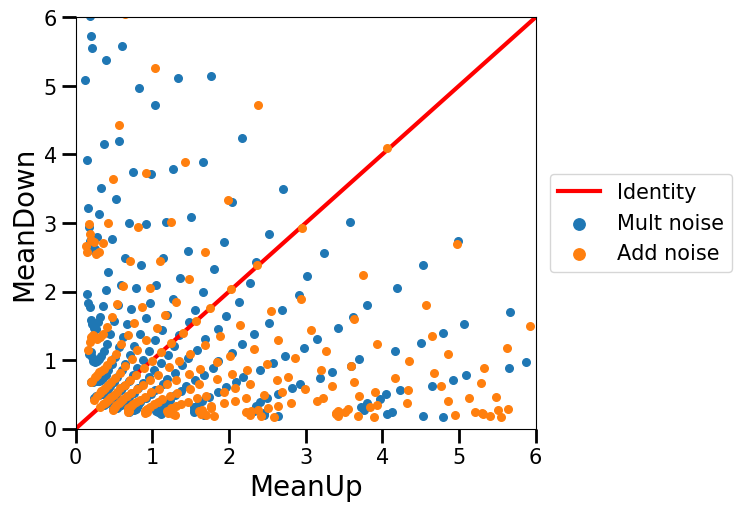

In [61]:
plt.figure(figsize = (7,5))
params = {'figure.figsize': (7,5),
          'lines.linewidth': 4,
          'legend.fontsize': 15,
         'axes.labelsize': 20,#25
         'axes.titlesize':25,#25
         'xtick.labelsize':15,#30
         'ytick.labelsize':15,#30
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)
plt.scatter(data_notnan[2],data_notnan[3],label = "Mult noise",s = 30,color = "tab:blue",zorder = 1)
plt.scatter(data_notnan_add_noadapt[2],data_notnan_add_noadapt[3],label = "Add noise",s = 30,color = "tab:orange",zorder = 2)
plt.xlim(0,6)
plt.ylim(0,6)
plt.plot([0,1,2,3,6],[0,1,2,3,6],color = "red",linewidth = 3,zorder = 1,label = "Identity")
plt.legend(markerscale = 1.5,loc='right',
                 bbox_to_anchor=(1.45, 0.5))
plt.xlabel("MeanUp")
plt.ylabel("MeanDown")
#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()

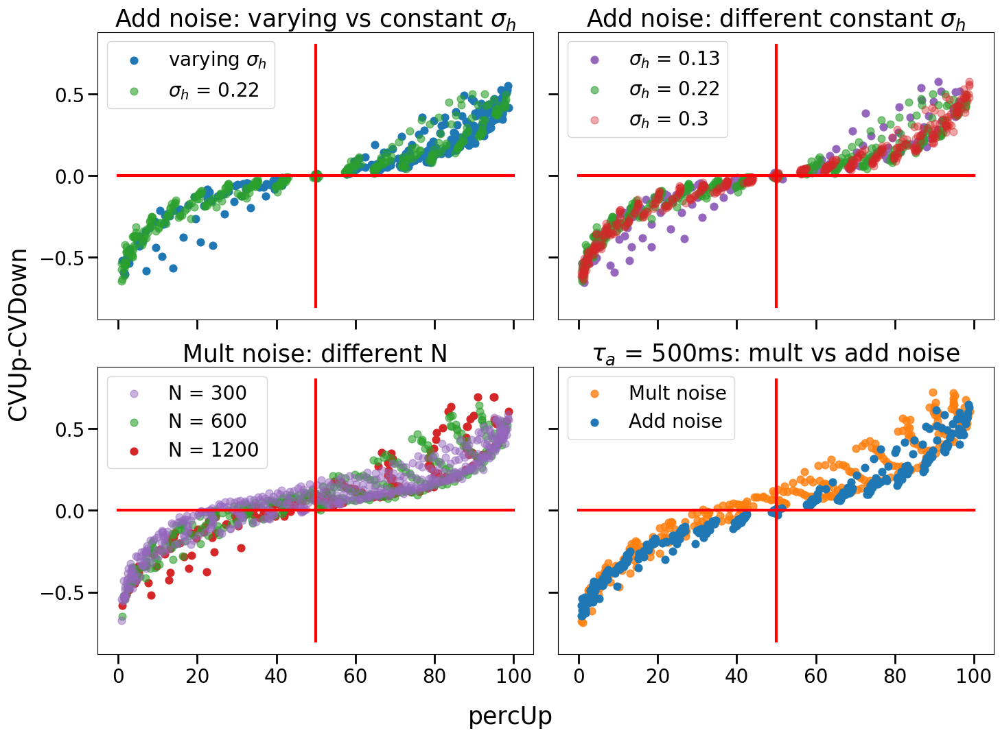

In [62]:
# plot of the CV statistics using different noise strength
params = {'figure.figsize': (14,10),
          'lines.linewidth': 4,
          'legend.fontsize': 20,
         'axes.labelsize': 25,#25
         'axes.titlesize':25,#25
         'xtick.labelsize':20,#30
         'ytick.labelsize':20,#30
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)

#,,

fig,((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize = (14,10),constrained_layout = True,sharex = True,sharey = 'row')
ax1.scatter(data_notnan_add_noadapt[0],data_notnan_add_noadapt[-4]-data_notnan_add_noadapt[-3],s = 60,color = "tab:blue", label = r"varying $\sigma_h$")
ax1.scatter(data_notnan_add_noadaptconst[0],data_notnan_add_noadaptconst[-4]-data_notnan_add_noadaptconst[-3],s = 60,color = "tab:green",alpha = 0.6,label = r"$\sigma_h$ = 0.22")
ax1.plot([0,100],[0,0],color = "red",linewidth = 3)
ax1.plot([50,50],[-0.8,0.8],color = "red",linewidth = 3)
ax1.set_title(r"Add noise: varying vs constant $\sigma_h$")
ax1.legend(loc = "upper left",fontsize = 20)

ax2.scatter(data_notnan_add_noadaptconstlow[0],data_notnan_add_noadaptconstlow[-4]-data_notnan_add_noadaptconstlow[-3],label = r"$\sigma_h$ = 0.13",s = 60,color = "tab:purple")
ax2.scatter(data_notnan_add_noadaptconst[0],data_notnan_add_noadaptconst[-4]-data_notnan_add_noadaptconst[-3],label = r"$\sigma_h$ = 0.22",s = 60,color = "tab:green",alpha = 0.6)
ax2.scatter(data_notnan_add_noadaptconsthigh[0],data_notnan_add_noadaptconsthigh[-4]-data_notnan_add_noadaptconsthigh[-3],label = r"$\sigma_h$ = 0.3",s = 60,color = "tab:red",alpha = 0.4)
ax2.plot([0,100],[0,0],color = "red",linewidth = 3)
ax2.plot([50,50],[-0.8,0.8],color = "red",linewidth = 3)
ax2.legend(loc = "upper left",fontsize = 20)
ax2.set_title(r"Add noise: different constant $\sigma_h$")


ax3.scatter(data_notnan300[0],data_notnan300[-4]-data_notnan300[-3],label = "N = 300",s = 60,color = "tab:purple",zorder = 3,alpha = 0.5)
ax3.scatter(data_notnan[0],data_notnan[-4]-data_notnan[-3],label = "N = 600",s = 60,alpha = 0.6,color = "tab:green",zorder =2)
ax3.scatter(data_notnan1200[0],data_notnan1200[-4]-data_notnan1200[-3],label = "N = 1200",s = 60,color = "tab:red",zorder = 1)
ax3.legend(loc = "upper left",fontsize = 20)
ax3.plot([0,100],[0,0],color = "red",linewidth = 3,zorder = 4)
ax3.plot([50,50],[-0.8,0.8],color = "red",linewidth = 3,zorder = 5)
ax3.set_title(r"Mult noise: different N")

ax4.scatter(data_notnan_tau500[0],data_notnan_tau500[-4]-data_notnan_tau500[-3],s = 60,alpha = 0.8,color = "tab:orange",label = "Mult noise")
ax4.scatter(data_notnan_add_tau500[0],data_notnan_add_tau500[-4]-data_notnan_add_tau500[-3],label = "Add noise",s = 60,color = "tab:blue")
ax4.legend(loc = "upper left",fontsize = 20)
ax4.plot([0,100],[0,0],color = "red",linewidth = 3)
ax4.plot([50,50],[-0.8,0.8],color = "red",linewidth = 3)
ax4.set_title(r"$\tau_a$ = 500ms: mult vs add noise ")


fig.text(-0.03,0.4,r"CVUp-CVDown",rotation = "vertical",fontsize = 25)
fig.text(0.45,-0.05,r"percUp",fontsize = 25)

#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()



# Coloring of the line structure of the scatterplot

In [30]:
diagonals_matrix = load(Path.joinpath(path_regime, 'diagonals_matrix.npy'))

nan_scclag1 = np.isnan(stats_mult[-1])
nan_scclag1_add = np.isnan(stats_add_change[-1])

In [31]:
diagonals_notnan = diagonals_matrix[~nan_scclag1]
diagonals_notnan_add = diagonals_matrix[~nan_scclag1_add]

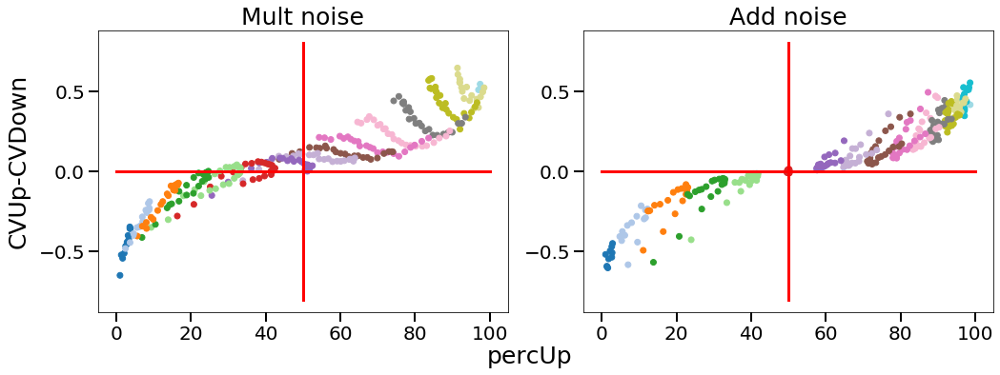

In [32]:
params = {'figure.figsize': (14,10),
          'lines.linewidth': 4,
          'legend.fontsize': 20,
         'axes.labelsize': 25,#25
         'axes.titlesize':25,#25
         'xtick.labelsize':20,#30
         'ytick.labelsize':20,#30
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)

bounds = range(int(min(diagonals_notnan_add)),int(max(diagonals_notnan_add))+1,1)
cmap_20 = plt.cm.get_cmap("tab20")
norm = colors.BoundaryNorm(bounds, cmap_20.N)

f, (ax1, ax2) = plt.subplots(1,2,figsize=(14,5),constrained_layout=True,sharex = True)
fig1 = ax1.scatter(data_notnan[0],data_notnan[-4]-data_notnan[-3],c = diagonals_notnan,label = "Mult Noise",cmap = "tab20",norm = norm)
ax1.plot([0,100],[0,0],color = "red",linewidth = 3)
ax1.plot([50,50],[-0.8,0.8],color = "red",linewidth = 3)
ax1.set_title("Mult noise")
#cbar = f.colorbar(fig1,ticks=np.array(np.arange(-10,12,1))+0.5, ax = [ax1,ax2],location = "right",pad = 0.025)
#cbar.set_ticklabels(np.array(np.arange(-5,10,1)))
#cbar.set_label(r"Offset from $I_{\frac{1}{2}}$ diagonal")

ax2.scatter(data_notnan_add_noadapt[0],data_notnan_add_noadapt[-4]-data_notnan_add_noadapt[-3],c = diagonals_notnan_add,label = "Add Noise",cmap = "tab20")
ax2.plot([0,100],[0,0],color = "red",linewidth = 3)
ax2.plot([50,50],[-0.8,0.8],color = "red",linewidth = 3)
ax2.set_title("Add noise")

f.text(-0.03,0.3,r"CVUp-CVDown",rotation = "vertical",fontsize = 25)
f.text(0.47,-0.05,r"percUp",fontsize = 25)

#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()

In [37]:
# only show those diagonals which are also shown in the CVdiff plot
diagonals_matrix[np.where(diagonals_matrix < -5)] = np.nan
diagonals_matrix[np.where(diagonals_matrix > 9)] = np.nan

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in less
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in greater
  This is separate from the ipykernel package so we can avoid doing imports until


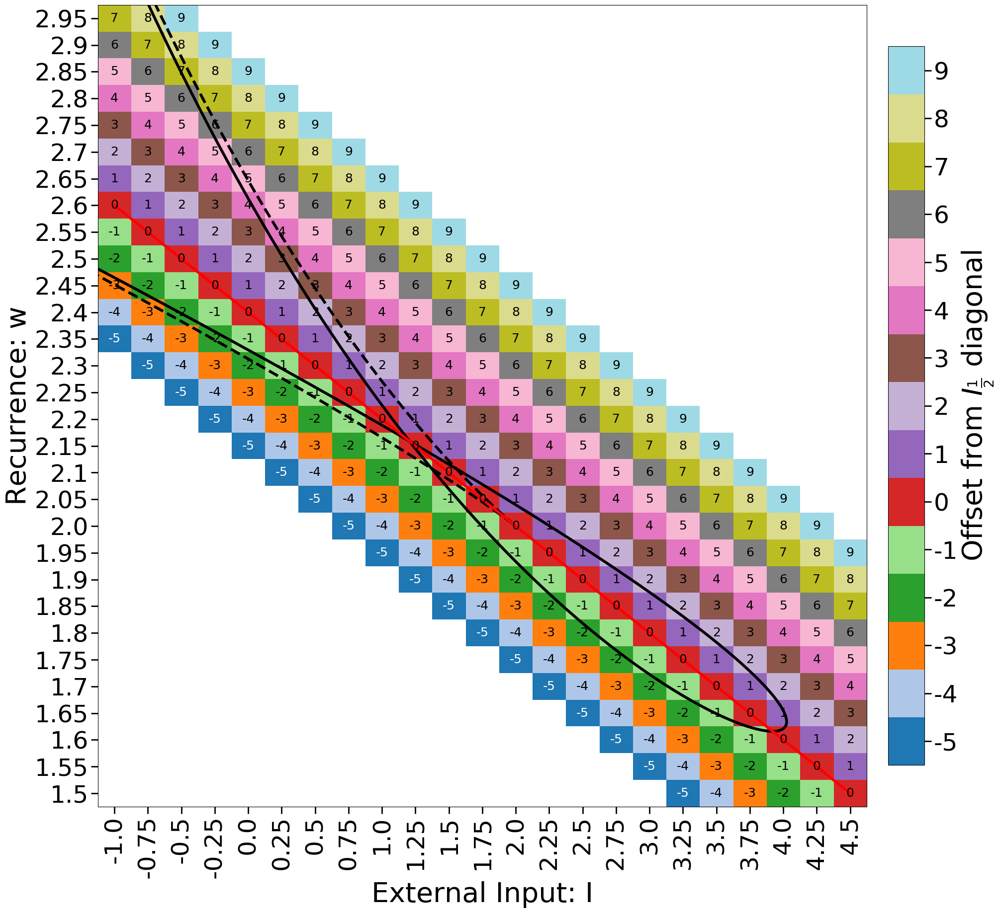

In [38]:
plt_funcs.heatmap_diagonals(diagonals_matrix,diagonals_notnan_add,I_grid,w_grid,hopf_x,hopf_y,cusp_x,cusp_y,r"","External Input: I","Recurrence: w",r"Offset from $I_{\frac{1}{2}}$ diagonal",round_int = 0,round_int2 = 0,equal_dur = True,saveplot = False)

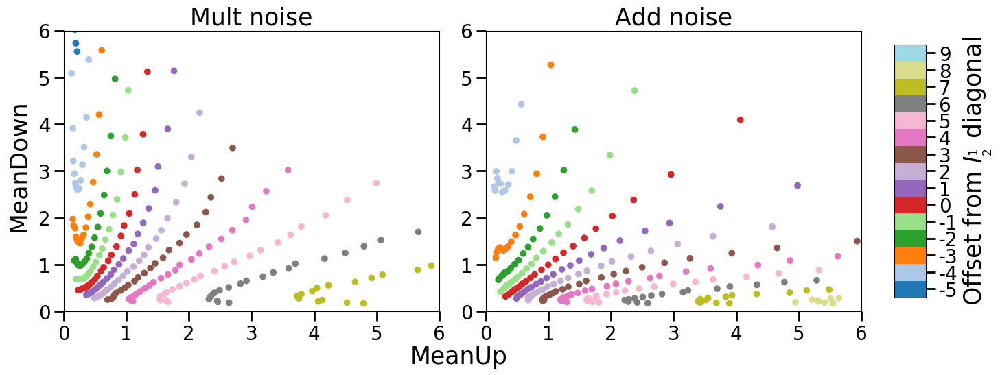

In [41]:
params = {'figure.figsize': (14,10),
          'lines.linewidth': 4,
          'legend.fontsize': 20,
         'axes.labelsize': 25,#25
         'axes.titlesize':25,#25
         'xtick.labelsize':20,#30
         'ytick.labelsize':20,#30
            'xtick.major.size': 10,
          'xtick.major.width' : 2,
          'xtick.minor.size' :5,
          'xtick.minor.width' : 1,
         'ytick.major.size': 10,
          'ytick.major.width' : 2,
          'ytick.minor.size' :5,
          'ytick.minor.width' : 1,
         'figure.constrained_layout.use': True}
plt.rcParams.update(params)
f, (ax1, ax2) = plt.subplots(1,2,figsize=(14,5),constrained_layout=True,sharex = True)
fig1 = ax1.scatter(data_notnan[2],data_notnan[3],c = diagonals_notnan,label = "Mult Noise",cmap = "tab20",norm = norm)
cbar = f.colorbar(fig1,ticks=np.array(np.arange(-10,12,1))+0.5, ax = [ax1,ax2],location = "right",pad = 0.025,shrink = 0.9)
cbar.set_ticklabels(np.array(np.arange(-5,10,1)))
cbar.set_label(r"Offset from $I_{\frac{1}{2}}$ diagonal")
ax1.set_xlim(0,6)
ax1.set_ylim(0,6)
ax1.set_title("Mult noise")

ax2.scatter(data_notnan_add_noadapt[2],data_notnan_add_noadapt[3],c = diagonals_notnan_add,label = "Add Noise",cmap = "tab20")
ax2.set_xlim(0,6)
ax2.set_ylim(0,6)
ax2.set_title("Add noise")
f.text(-0.03,0.35,r"MeanDown",rotation = "vertical",fontsize = 25)
f.text(0.39,-0.05,r"MeanUp",fontsize = 25)
#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()

# Validating results of Poisson Noise

In [38]:
# validating the results for Poisson Noise over the grid
# show SCC plot and CV Plot on top of the gauss mult noise model
main_path_poiss = Path.joinpath(path_data, "Mult_Noise/N_600/Poisson/grid_poisson/")
stats_poiss = data_proc.load_stats_data(main_path_poiss)
data_notnan_poiss,regime_notnan_poiss,label_notnan_poiss = data_proc.getnotnan_scc_data(stats_poiss,regime_matrix,0)


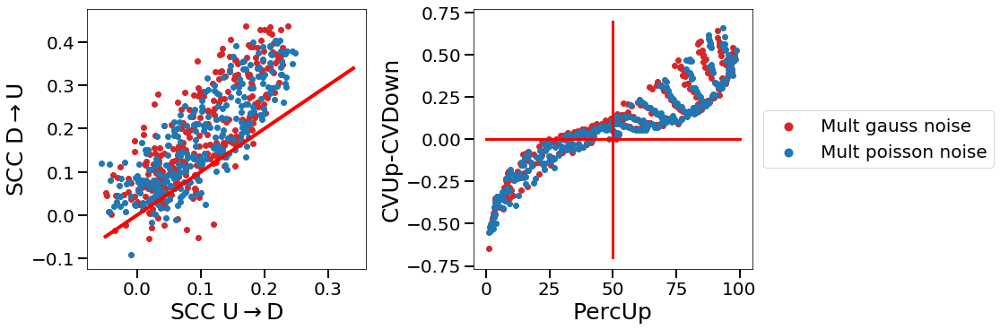

In [39]:
f, (ax1, ax2) = plt.subplots(1,2,figsize=(15,5),constrained_layout=True)
ax1.scatter(data_notnan[-2],data_notnan[-1],color = "tab:red")
ax1.scatter(data_notnan_poiss[-2],data_notnan_poiss[-1],color = "tab:blue")
ax1.set_xlabel(r"SCC U$\rightarrow$D")
ax1.set_ylabel(r"SCC D$\rightarrow$U")
ax1.plot(x_full,x_full,color = "red",label = "Identity")

ax2.scatter(data_notnan[0],data_notnan[-4]-data_notnan[-3],label = "Mult gauss noise",color = "tab:red")
ax2.scatter(data_notnan_poiss[0],data_notnan_poiss[-4]-data_notnan_poiss[-3],color = "tab:blue",label = "Mult poisson noise")
ax2.set_xlabel("PercUp")
ax2.set_ylabel("CVUp-CVDown")
ax2.plot([0,100],[0,0],color = "red",linewidth = 3)
ax2.plot([50,50],[-0.7,0.7],color = "red",linewidth = 3)

plt.legend(markerscale = 1.5,loc='right',
                 bbox_to_anchor=(1.9, 0.5))
#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()

In [37]:
# results for add model with noise in the adaptation
main_path_add_withadapt = Path.joinpath(path_data, "Add_Noise/Kramers_moyal_N600/noise_exc_and_adapt/grid_add/")
stats_add_with_adapt = data_proc.load_stats_data(main_path_add_withadapt)
data_notnan_add_with_adapt,regime_notnan_add_with_adapt,label_notnan_add_with_adapt = data_proc.getnotnan_scc_data(stats_add_with_adapt,regime_matrix,0)



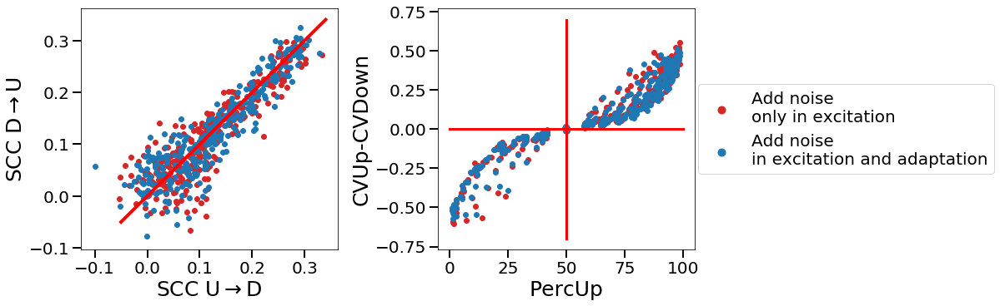

In [36]:
f, (ax1, ax2) = plt.subplots(1,2,figsize=(15,5),constrained_layout=True)
ax1.scatter(data_notnan_add_noadapt[-2],data_notnan_add_noadapt[-1],color = "tab:red")
ax1.scatter(data_notnan_add_with_adapt[-2],data_notnan_add_with_adapt[-1],color = "tab:blue")
ax1.set_xlabel(r"SCC U$\rightarrow$D")
ax1.set_ylabel(r"SCC D$\rightarrow$U")
ax1.plot(x_full,x_full,color = "red",label = "Identity")

ax2.scatter(data_notnan_add_noadapt[0],data_notnan_add_noadapt[-4]-data_notnan_add_noadapt[-3],label = "Add noise\nonly in excitation",color = "tab:red")
ax2.scatter(data_notnan_add_with_adapt[0],data_notnan_add_with_adapt[-4]-data_notnan_add_with_adapt[-3],color = "tab:blue",label = "Add noise\nin excitation and adaptation")
ax2.set_xlabel("PercUp")
ax2.set_ylabel("CVUp-CVDown")
ax2.plot([0,100],[0,0],color = "red",linewidth = 3)
ax2.plot([50,50],[-0.7,0.7],color = "red",linewidth = 3)

plt.legend(markerscale = 1.5,loc='right',
                 bbox_to_anchor=(2.2, 0.5))
#plt.savefig(path_save,dpi=200,bbox_inches='tight')
plt.show()